# Imports
Requirements: pip install nibabel matplotlib numpy requests tqdm

In [1]:
%load_ext autoreload
%autoreload 2

import json
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import nibabel as nib
import numpy as np

from aux_functions import scale_magnitude, load_volume, get_center_slices, extract_slices, simple_compression, mse, plot_wavelet

# I. Navigating the volumes

In [2]:
#DATA_ROOT = Path("/Users/sophiaklymchuk/Python-Cooper-Union/ECE-435 Medical Imaging/Project-3/ds001499/sub-CSI1/ses-16/anat")
DATA_ROOT = Path("/home/sophia/ECE-435-Medical-Imaging/Project-3/ds001499/sub-CSI1/ses-16/anat")

T1_PATH = DATA_ROOT / "sub-CSI1_ses-16_run-02_T1w.nii.gz"
T2_PATH = DATA_ROOT / "sub-CSI1_ses-16_T2w.nii.gz"
T1_JSON = DATA_ROOT / "sub-CSI1_ses-16_run-02_T1w.json"
T2_JSON = DATA_ROOT / "sub-CSI1_ses-16_T2w.json"

## Six-panel anatomical display

In [3]:
def plot_six_panels(t1, t2, save_path="part1_six_panels.png"):

    cx1, cy1, cz1 = get_center_slices(t1)
    cx2, cy2, cz2 = get_center_slices(t2)

    slices_t1 = extract_slices(t1, cx1, cy1, cz1)
    slices_t2 = extract_slices(t2, cx2, cy2, cz2)

    labels_t1 = [
        f"Sagittal slice {cx1}, T1-weighted",
        f"Coronal slice {cy1}, T1-weighted",
        f"Axial slice {cz1}, T1-weighted",
    ]
    labels_t2 = [
        f"Sagittal slice {cx2}, T2-weighted",
        f"Coronal slice {cy2}, T2-weighted",
        f"Axial slice {cz2}, T2-weighted",
    ]

    fig = plt.figure(figsize=(15, 10))
    fig.suptitle("Patient CSI1 – Anatomical MRI cross-sections", fontsize=16, fontweight="bold")
    gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.35, wspace=0.05)

    for row_idx, (slices, labels) in enumerate([(slices_t1, labels_t1), (slices_t2, labels_t2)]):
        for col_idx, (sl, lab) in enumerate(zip(slices, labels)):
            ax = fig.add_subplot(gs[row_idx, col_idx])
            ax.imshow(np.rot90(scale_magnitude(sl)), cmap="gray",
                      aspect="equal", interpolation="bilinear")
            ax.set_title(lab, fontsize=9, pad=4)
            ax.axis("off")

    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    print(f"Figure saved -> {save_path}")
    plt.show()



## Axis-anatomy correspondence

In [4]:
def print_axis_anatomy(vol_shape):
    print("\n--- Axis <-> Anatomy (standard RAS NIfTI) ---")
    print(f"  axis 0: Left <-> Right           (dim size = {vol_shape[0]})")
    print(f"  axis 1: Posterior <-> Anterior   (dim size = {vol_shape[1]})")
    print(f"  axis 2: Inferior <-> Superior    (dim size = {vol_shape[2]})")
    print()

##  T1 vs T2 brightness analysis & JSON pulse-sequence parameter analysis

In [5]:
T_TABLE = {
    "White Matter":        {"T1": 510,  "T2": 67},
    "Grey Matter":         {"T1": 760,  "T2": 77},
    "Cerebrospinal Fluid": {"T1": 2650, "T2": 280},
}

def analyze_tissue_brightness():
    print("\n--- Tissue brightness prediction ---")
    print("T1-weighted  (shorter T1 -> brighter)")
    for rank, (tissue, vals) in enumerate(sorted(T_TABLE.items(), key=lambda x: x[1]["T1"]), 1):
        print(f"  {rank}. {tissue:<25} T1={vals['T1']:>4} ms  (brightest={rank==1})")

    print("\nT2-weighted  (longer T2 -> brighter)")
    for rank, (tissue, vals) in enumerate(sorted(T_TABLE.items(), key=lambda x: x[1]["T2"], reverse=True), 1):
        print(f"  {rank}. {tissue:<25} T2={vals['T2']:>3} ms  (brightest={rank==1})")


def analyze_json_params(t1_json, t2_json):
    def _load(p):
        if not p.exists():
            print(f"  [WARN] JSON not found: {p}")
            return {}
        with open(p) as f:
            return json.load(f)

    j1 = _load(t1_json)
    j2 = _load(t2_json)

    keys = ["InversionTime", "EchoTime", "RepetitionTime", "FlipAngle"]
    print("\n--- Pulse-sequence parameters (from JSON sidecars) ---")
    print(f"  {'Parameter':<20} {'T1w':>12} {'T2w':>12}")
    print("  " + "-" * 46)
    for k in keys:
        print(f"  {k:<20} {str(j1.get(k,'N/A')):>12} {str(j2.get(k,'N/A')):>12}")

    print("""
  Unit inference
  --------------
  BIDS stores times in seconds. EchoTime~0.09 and RepetitionTime~2.5
  only make sense as SECONDS:
    CSF T1=2650ms=2.65s  -> TR~2-3s is right for T1 contrast
    WM  T2=67ms=0.067s   -> TE~0.01-0.1s matches T2w scans
  Units are SECONDS.

  Weighting explained
  -------------------
  InversionTime (TI): nulls a tissue or maximises T1 contrast.
    TI ~ 0.69 * T1_tissue sets the null point for that tissue.

  EchoTime (TE): delay between excitation and readout.
    T2w: long TE so only long-T2 tissues retain signal.
    T1w: short TE to minimise T2 decay.

  RepetitionTime (TR):
    Short TR -> T1 contrast (short-T1 tissues recover more between pulses).
    Long  TR -> proton-density or T2 contrast.
""")

## Guiding image (center-x sagittal of T1)

In [6]:
def save_guiding_image(t1, save_path="part1_guiding_image.png"):
    cx = t1.shape[0] // 2
    guide = t1[cx, :, :]

    fig, ax = plt.subplots(figsize=(5, 6))
    ax.imshow(np.rot90(scale_magnitude(guide)), cmap="gray",
              aspect="equal", interpolation="bilinear")
    ax.set_title(f"Guiding image – Sagittal slice {cx}, T1-weighted", fontsize=11)
    ax.axis("off")
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(save_path, dpi=150, bbox_inches="tight")
    print(f"Guiding image saved -> {save_path}")
    plt.show()
    return guide

## Part I Main

Loaded sub-CSI1_ses-16_run-02_T1w.nii.gz  shape=(176, 256, 256)  dtype=int16
Loaded sub-CSI1_ses-16_T2w.nii.gz  shape=(176, 256, 256)  dtype=int16

--- Axis <-> Anatomy (standard RAS NIfTI) ---
  axis 0: Left <-> Right           (dim size = 176)
  axis 1: Posterior <-> Anterior   (dim size = 256)
  axis 2: Inferior <-> Superior    (dim size = 256)

Figure saved -> part1_six_panels.png


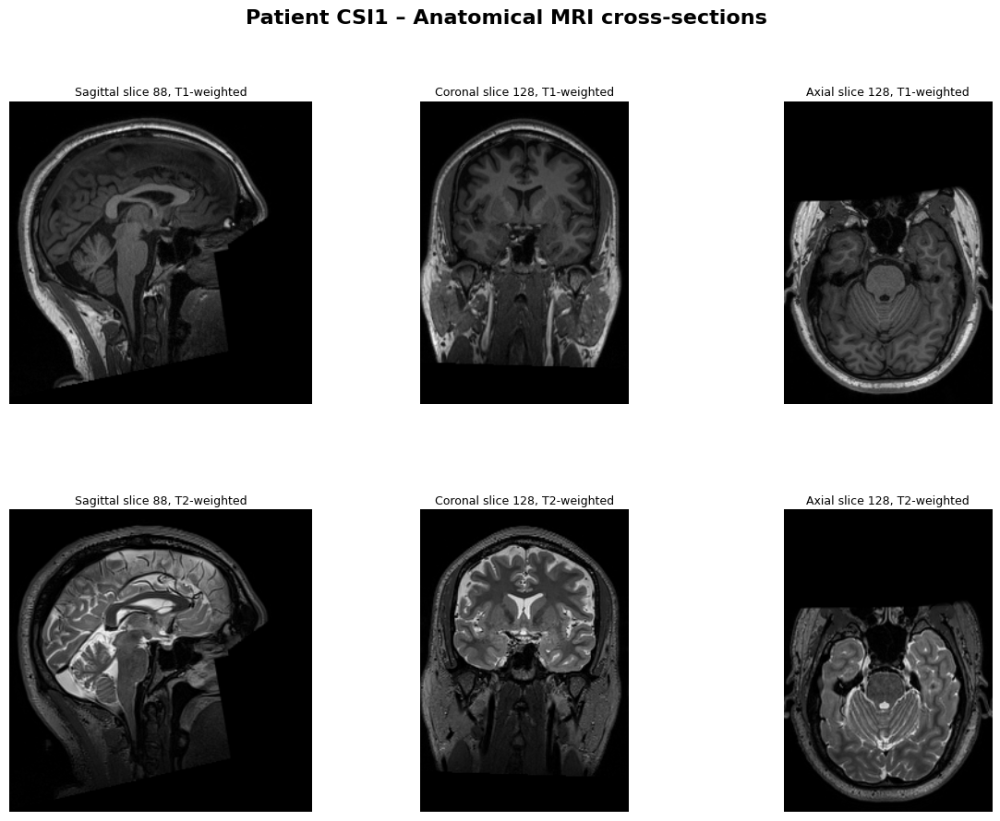


--- Tissue brightness prediction ---
T1-weighted  (shorter T1 -> brighter)
  1. White Matter              T1= 510 ms  (brightest=True)
  2. Grey Matter               T1= 760 ms  (brightest=False)
  3. Cerebrospinal Fluid       T1=2650 ms  (brightest=False)

T2-weighted  (longer T2 -> brighter)
  1. Cerebrospinal Fluid       T2=280 ms  (brightest=True)
  2. Grey Matter               T2= 77 ms  (brightest=False)
  3. White Matter              T2= 67 ms  (brightest=False)

--- Pulse-sequence parameters (from JSON sidecars) ---
  Parameter                     T1w          T2w
  ----------------------------------------------
  InversionTime                 0.9          N/A
  EchoTime                  0.00197        0.422
  RepetitionTime                2.3            3
  FlipAngle                       9          120

  Unit inference
  --------------
  BIDS stores times in seconds. EchoTime~0.09 and RepetitionTime~2.5
  only make sense as SECONDS:
    CSF T1=2650ms=2.65s  -> TR~2-3s is ri

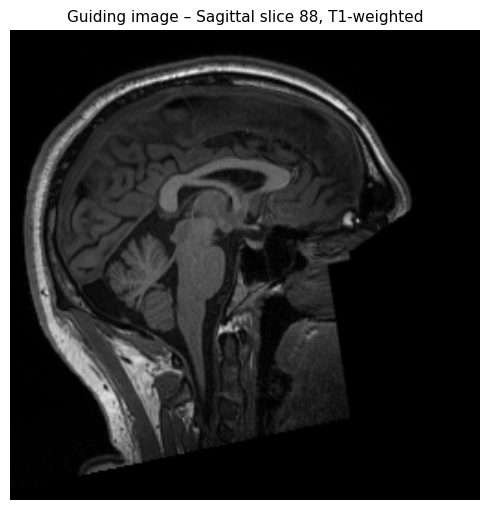


Part I complete. Guiding image shape: (256, 256)


In [23]:
missing = [p for p in (T1_PATH, T2_PATH) if not p.exists()]
if missing:
    for p in missing:
        print(f"File not found: {p}")
    raise FileNotFoundError("Fix the paths above before continuing.")

t1 = load_volume(T1_PATH)
t2 = load_volume(T2_PATH)

print_axis_anatomy(t1.shape)
plot_six_panels(t1, t2)
analyze_tissue_brightness()
analyze_json_params(T1_JSON, T2_JSON)
guiding_image = save_guiding_image(t1)

print(f"\nPart I complete. Guiding image shape: {guiding_image.shape}")

# III. Fourier Domain Compression?

## 2D Fourier transform of the guiding image

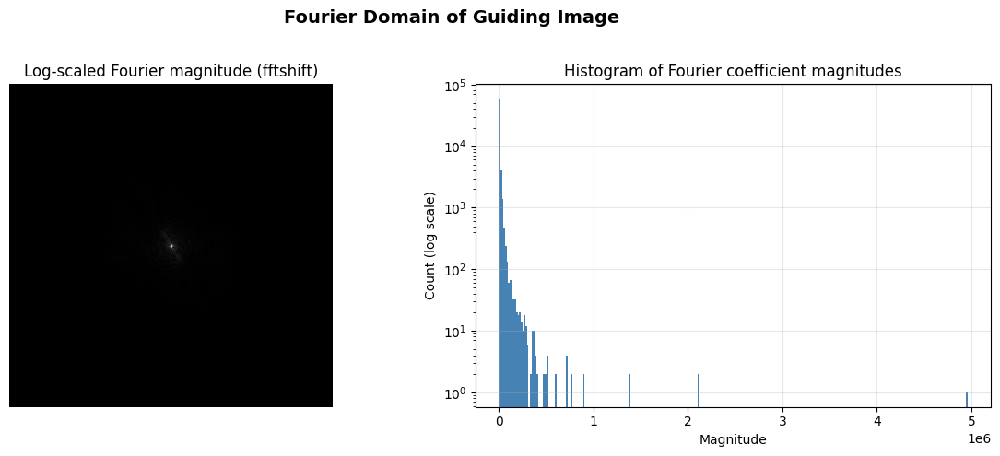


--- Fourier Sparsity ---
  Total coefficients : 65536
  Bottom 90% by mag  : 58982  (90.0% of all coefficients)
  -> The distribution is heavily right-skewed: most energy is concentrated
     in a small fraction of low-frequency coefficients near the center.


In [27]:
def nrmse(ground_truth, recon):
    return np.sqrt(mse(ground_truth, recon)) / ground_truth.max()

F = np.fft.fftshift(np.fft.fft2(guiding_image.astype(float)))
F_mag = np.abs(F)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle("Fourier Domain of Guiding Image", fontsize=14, fontweight="bold")

axes[0].imshow(np.log1p(scale_magnitude(F_mag)), cmap="gray", aspect="equal")
axes[0].set_title("Log-scaled Fourier magnitude (fftshift)")
axes[0].axis("off")

axes[1].hist(F_mag.ravel(), bins=300, color="steelblue", edgecolor="none", log=True)
axes[1].set_title("Histogram of Fourier coefficient magnitudes")
axes[1].set_xlabel("Magnitude")
axes[1].set_ylabel("Count (log scale)")
axes[1].grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part3_fourier_domain.png", dpi=150, bbox_inches="tight")
plt.show()

# Sparsity comment
total     = F_mag.size
near_zero = np.sum(F_mag < np.percentile(F_mag, 90))
print(f"\n--- Fourier Sparsity ---")
print(f"  Total coefficients : {total}")
print(f"  Bottom 90% by mag  : {near_zero}  ({100*near_zero/total:.1f}% of all coefficients)")
print(f"  -> The distribution is heavily right-skewed: most energy is concentrated")
print(f"     in a small fraction of low-frequency coefficients near the center.")

## Reconstruct after zeroing s% of Fourier coefficients

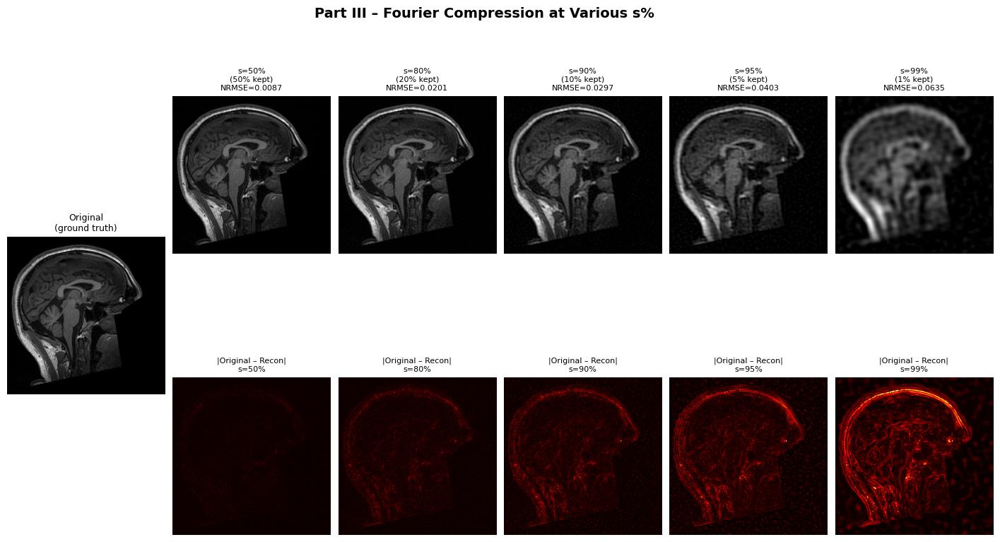

In [ ]:
# Pre-compute all reconstructions and difference images
recons = []
diffs  = []
s_values = [50, 80, 90, 95, 99]
for s in s_values:
    F_thresh = simple_compression(F, s)
    recon    = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(F_thresh))), 0, None)
    recons.append(recon)
    diffs.append(np.abs(guiding_image.astype(float) - recon))

global_max = max(d.max() for d in diffs)

# Now plot
fig = plt.figure(figsize=(18, 9))
fig.suptitle("Fourier Compression at Various s%", fontsize=14, fontweight="bold")
gs  = gridspec.GridSpec(2, len(s_values) + 1, figure=fig, hspace=0.35, wspace=0.05)

ax_orig = fig.add_subplot(gs[:, 0])
ax_orig.imshow(np.rot90(scale_magnitude(guiding_image)), cmap="gray", aspect="equal")
ax_orig.set_title("Original\n(ground truth)", fontsize=9)
ax_orig.axis("off")

for col, (s, recon, diff) in enumerate(zip(s_values, recons, diffs), start=1):
    kept_pct = 100 - s

    ax_img = fig.add_subplot(gs[0, col])
    ax_img.imshow(np.rot90(scale_magnitude(recon)), cmap="gray", aspect="equal")
    ax_img.set_title(f"s={s}%\n({kept_pct}% kept)\nNRMSE={nrmse(guiding_image, recon):.4f}", fontsize=8)
    ax_img.axis("off")

    ax_diff = fig.add_subplot(gs[1, col])
    ax_diff.imshow(np.rot90(diff / global_max), cmap="hot", vmin=0, vmax=1, aspect="equal")
    ax_diff.set_title(f"|Original – Recon|\ns={s}%", fontsize=8)
    ax_diff.axis("off")

plt.savefig("part3_fourier_compression.png", dpi=150, bbox_inches="tight")
plt.show()

## MSE vs s% summary table

In [10]:
print("\n--- MSE vs Zeroed Percentage ---")
print(f"  {'s (% zeroed)':>14}  {'% kept':>8}  {'MSE':>12}  {'PSNR (dB)':>10}  {'NRMSE':>10}")
print("  " + "-" * 62)
max_val = float(guiding_image.max())
for s in s_values:
    F_thresh  = simple_compression(F, s)
    recon     = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(F_thresh))), 0, None)
    err       = mse(guiding_image, recon)
    psnr      = 10 * np.log10(max_val**2 / err) if err > 0 else float("inf")
    nr        = nrmse(guiding_image, recon)
    print(f"  {s:>14}  {100-s:>8}  {err:>12.2f}  {psnr:>10.2f}  {nr:>10.4f}")

print("""
--- Observations ---
  Even at s=99% (only 1% of coefficients kept), the MSE may look 'acceptable'
  numerically, but the reconstructed image looks severely degraded visually.
  This is because low-magnitude Fourier coefficients carry critical phase
  information that reconstructs fine spatial detail and edges.
  Zeroing them destroys phase coherence, producing ringing artifacts (Gibbs
  phenomenon) even when the discarded magnitudes are small.
  -> Conclusion: Fourier domain sparsity exists, but it cannot be exploited
     for image compression because phase information is non-redundant.
""")


--- MSE vs Zeroed Percentage ---
    s (% zeroed)    % kept           MSE   PSNR (dB)       NRMSE
  --------------------------------------------------------------
              50        50         36.31       41.23      0.0087
              80        20        194.81       33.93      0.0201
              90        10        424.81       30.55      0.0297
              95         5        783.96       27.88      0.0403
              99         1       1942.14       23.94      0.0635

--- Observations ---
  Even at s=99% (only 1% of coefficients kept), the MSE may look 'acceptable'
  numerically, but the reconstructed image looks severely degraded visually.
  This is because low-magnitude Fourier coefficients carry critical phase
  information that reconstructs fine spatial detail and edges.
  Zeroing them destroys phase coherence, producing ringing artifacts (Gibbs
  phenomenon) even when the discarded magnitudes are small.
  -> Conclusion: Fourier domain sparsity exists, but it canno

## Row-per-s figure: compressed image | FFT log mag | FFT log mag histogram

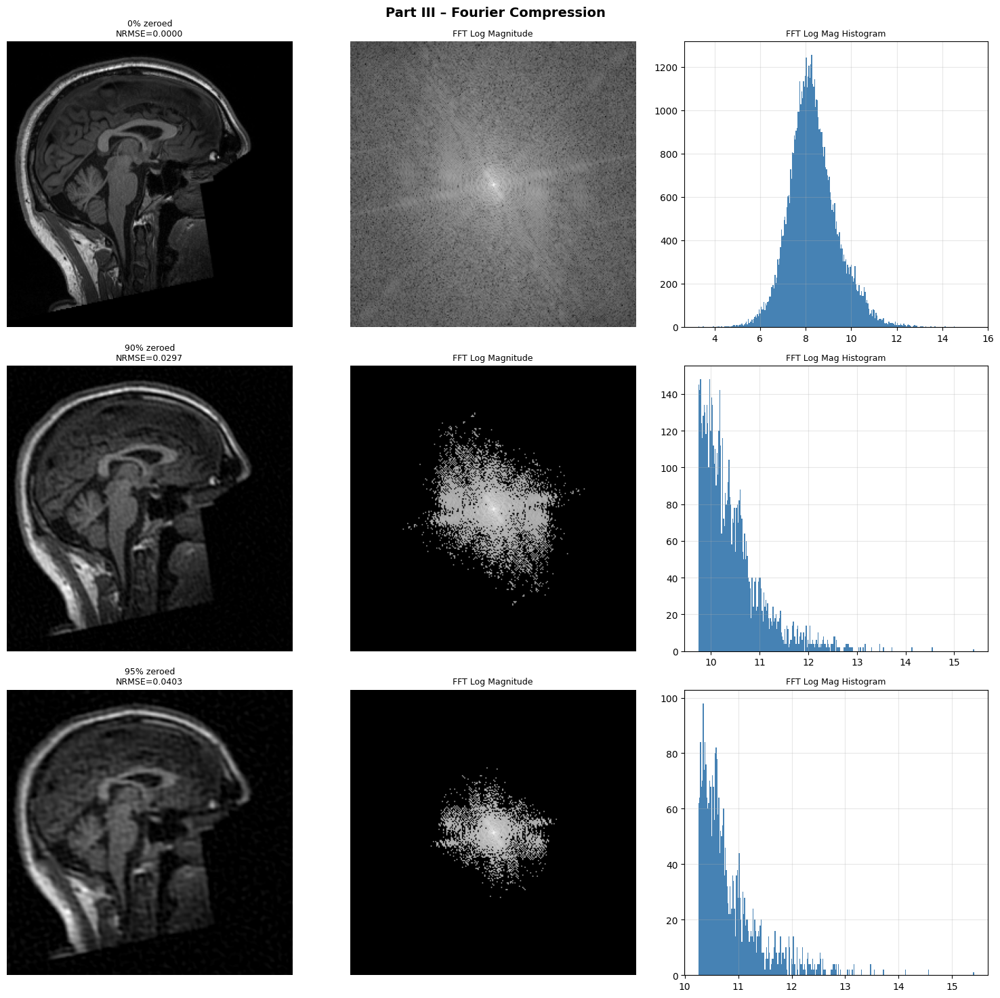

In [ ]:
s_values_iii = [0, 90, 95]   # match prior student's choice for the figure

fig, axes = plt.subplots(len(s_values_iii), 3, figsize=(15, 5*len(s_values_iii)))
fig.suptitle("Fourier Compression", fontsize=14, fontweight="bold")

for row, s in enumerate(s_values_iii):
    F_thresh = simple_compression(F, s) if s > 0 else F
    recon    = np.clip(np.real(np.fft.ifft2(np.fft.ifftshift(F_thresh))), 0, None)

    fft_log  = np.log1p(np.abs(F_thresh))

    axes[row, 0].imshow(np.rot90(scale_magnitude(recon)), cmap="gray", aspect="equal")
    axes[row, 0].set_title(f"{s}% zeroed\nNRMSE={nrmse(guiding_image, recon):.4f}", fontsize=9); axes[row, 0].axis("off")

    axes[row, 1].imshow(scale_magnitude(fft_log), cmap="gray", aspect="equal")
    axes[row, 1].set_title("FFT Log Magnitude", fontsize=9); axes[row, 1].axis("off")

    flat = fft_log.ravel()
    flat_nonzero = flat[flat > 0]
    axes[row, 2].hist(flat_nonzero, bins=300, color="steelblue", edgecolor="none", align="left")
    axes[row, 2].set_title("FFT Log Mag Histogram", fontsize=9)
    axes[row, 2].grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part3_fourier_compression_v2.png", dpi=150, bbox_inches="tight")
plt.show()

# IV. Wavelet Domains

  image shape: (512, 512), cA2 shape: (128, 128), target: (512, 512)


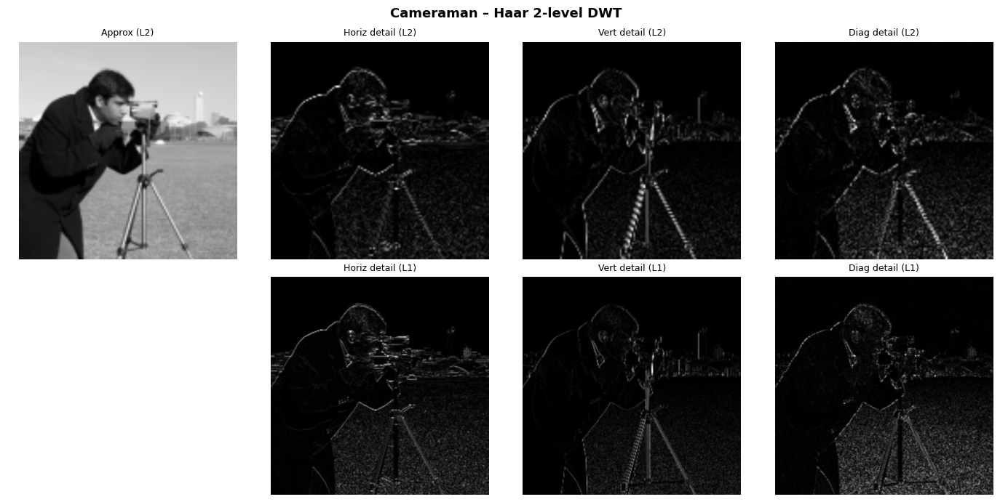

  image shape: (512, 512), cA2 shape: (133, 133), target: (512, 512)


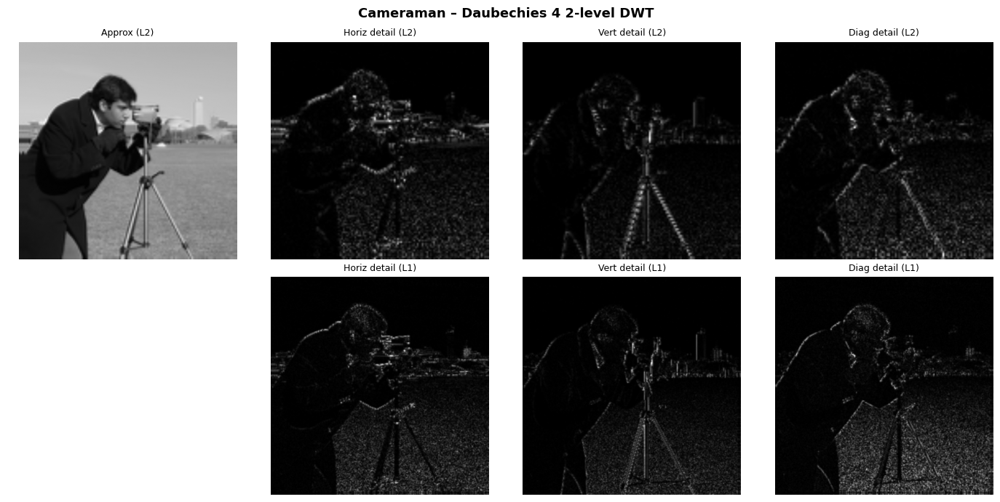

  image shape: (512, 512), cA2 shape: (140, 140), target: (512, 512)


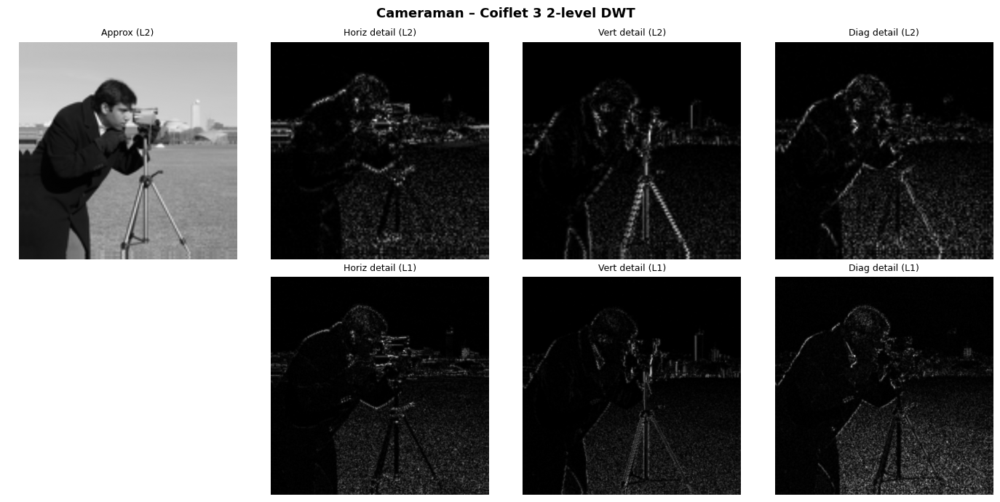

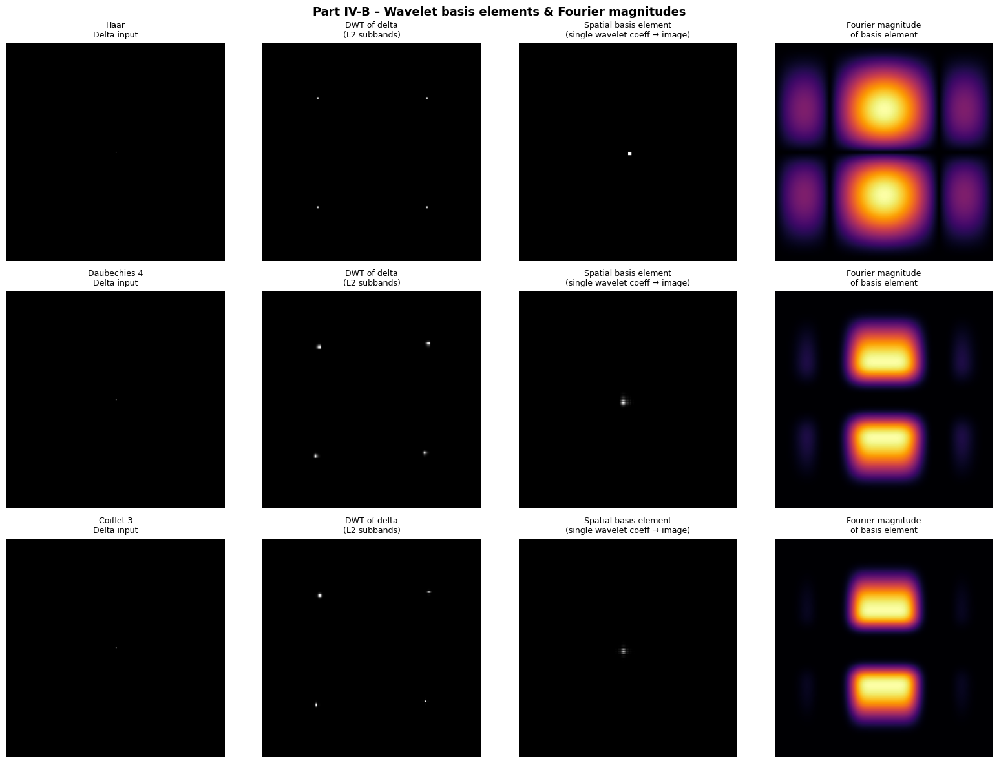


--- IV-B Observations ---
  Haar:         Box-shaped basis function → sharp spatial edges, broad frequency spread.
                Poorly localized in frequency (high-pass but with wide sidelobes).
  Daubechies 4: Smoother, slightly oscillatory basis → better frequency localization
                than Haar, moderate spatial spread.
  Coiflet 3:    Near-symmetric, smooth basis → best joint space/frequency localization.
                Fourier magnitude shows a cleaner bandpass profile.
  All three are compactly supported in space (unlike Fourier sinusoids) — this is
  what enables sparse representation of piecewise-smooth images like MRI.



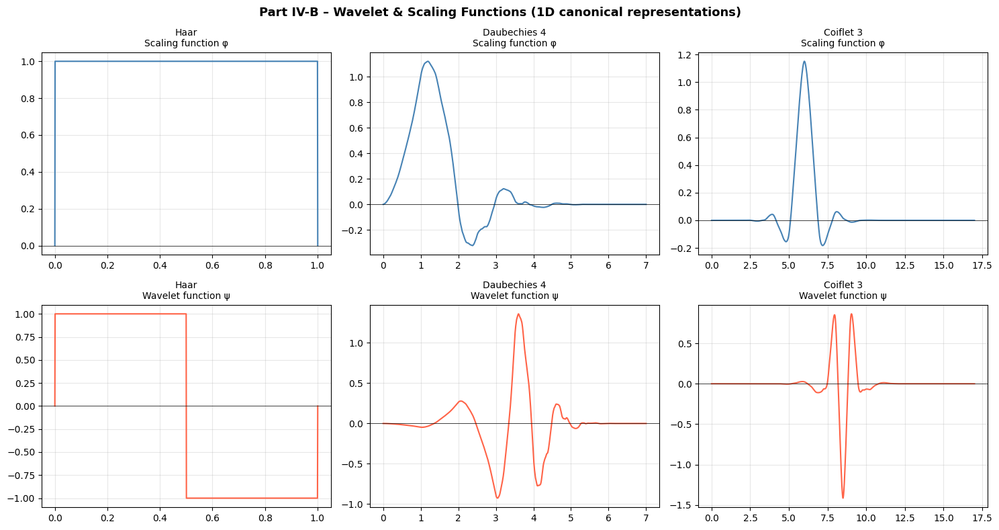


--- Wavelet Function Observations ---
  Haar:         Step function — abrupt transitions, compact support of width 1.
                Scaling function is a box; wavelet is a Haar step (+1/-1).
  Daubechies 4: Smoother, asymmetric, support width = 7. Oscillatory but compact.
  Coiflet 3:    Near-symmetric scaling AND wavelet functions. Support width = 17.
                Higher vanishing moments produce smoother, more balanced functions.
  These shapes directly explain compression performance: smoother wavelets with
  more vanishing moments produce sparser coefficients on smooth images like MRI.



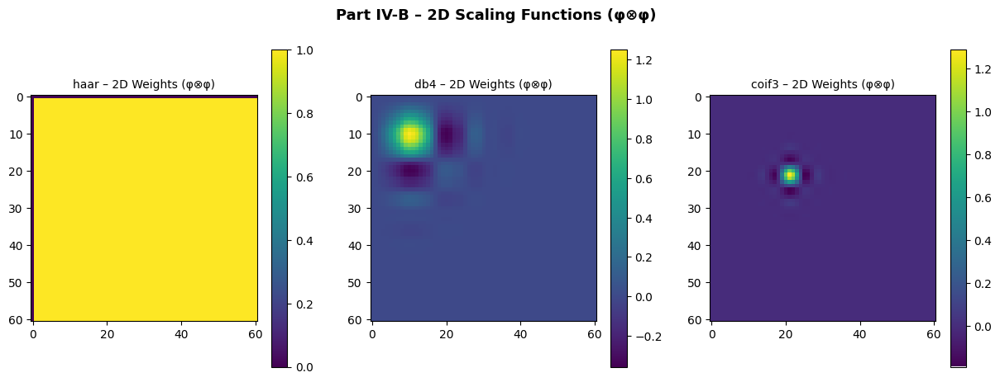

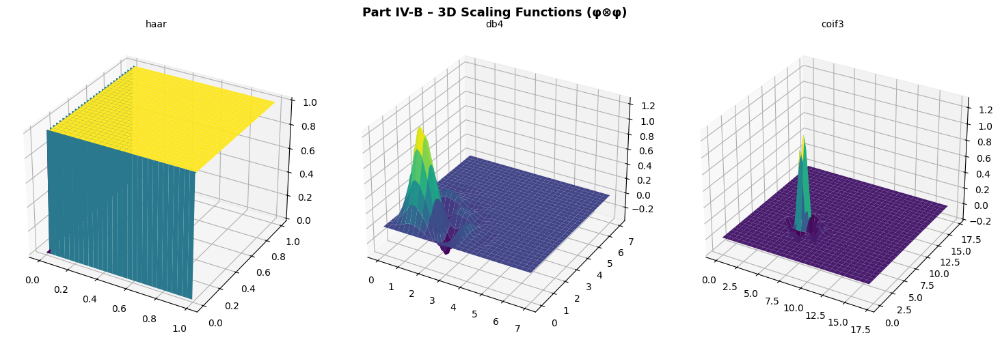

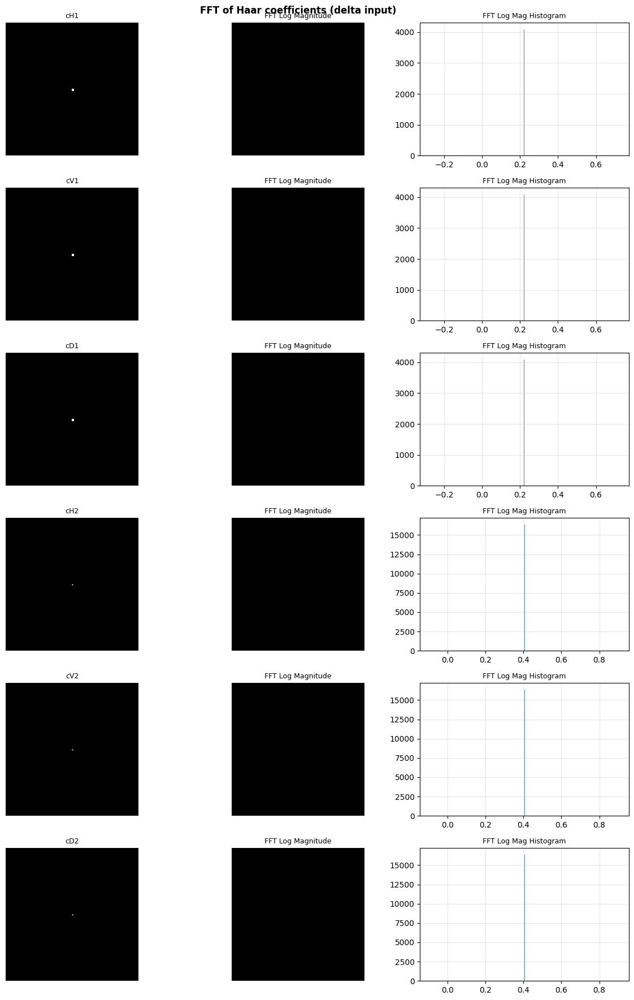

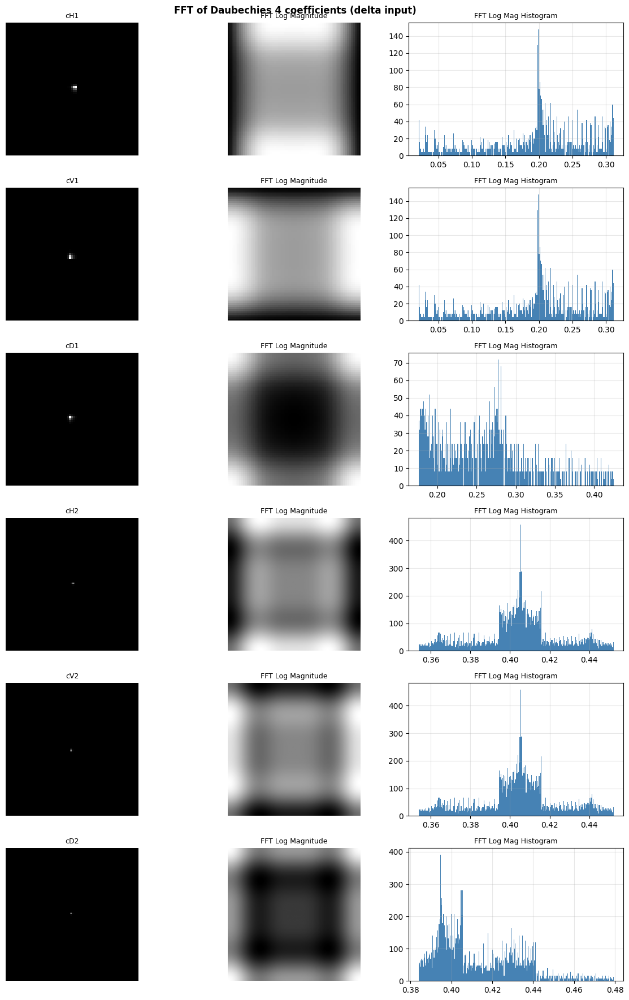

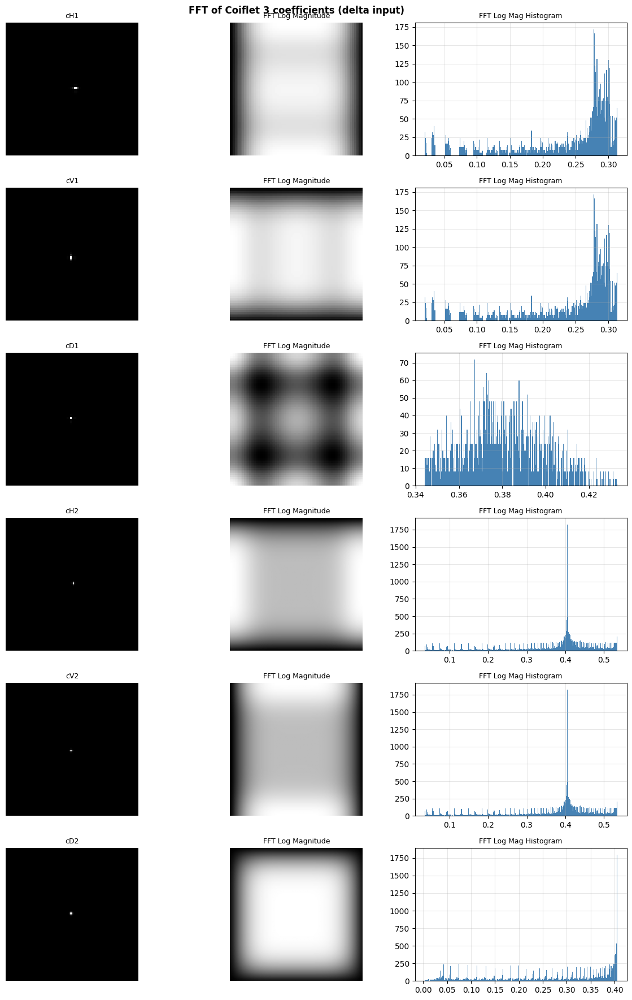

  image shape: (256, 256), cA2 shape: (64, 64), target: (256, 256)


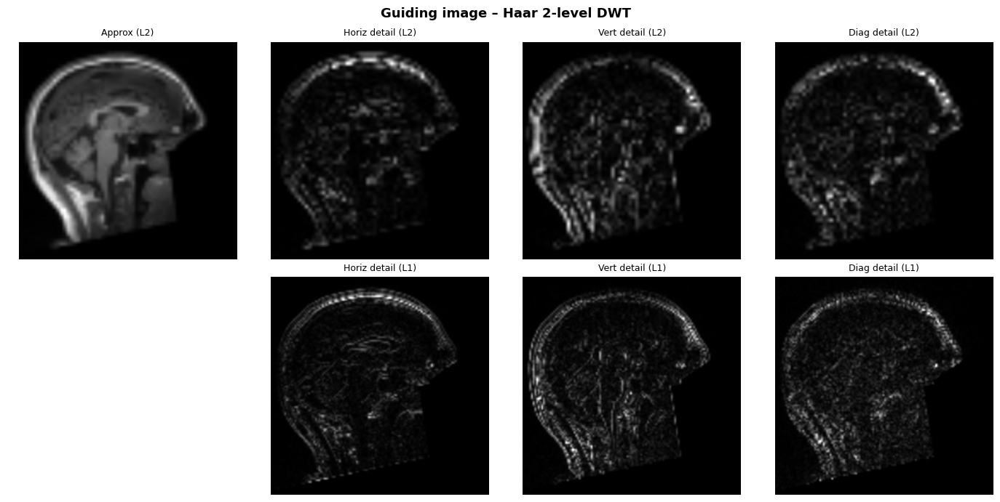

  image shape: (256, 256), cA2 shape: (69, 69), target: (256, 256)


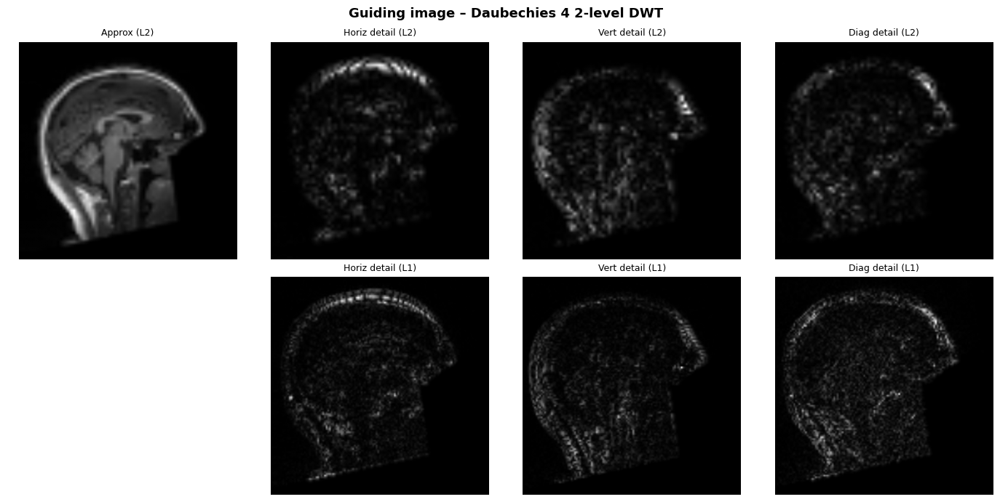

  image shape: (256, 256), cA2 shape: (76, 76), target: (256, 256)


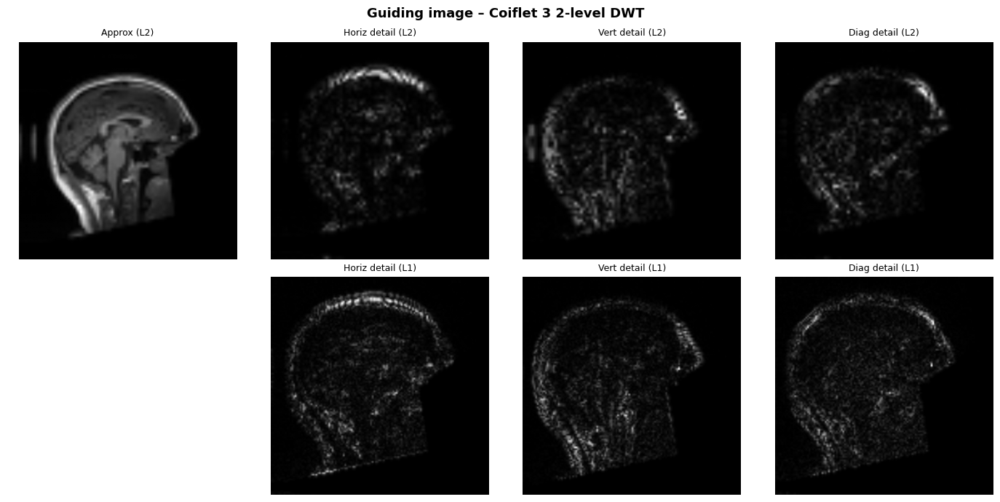

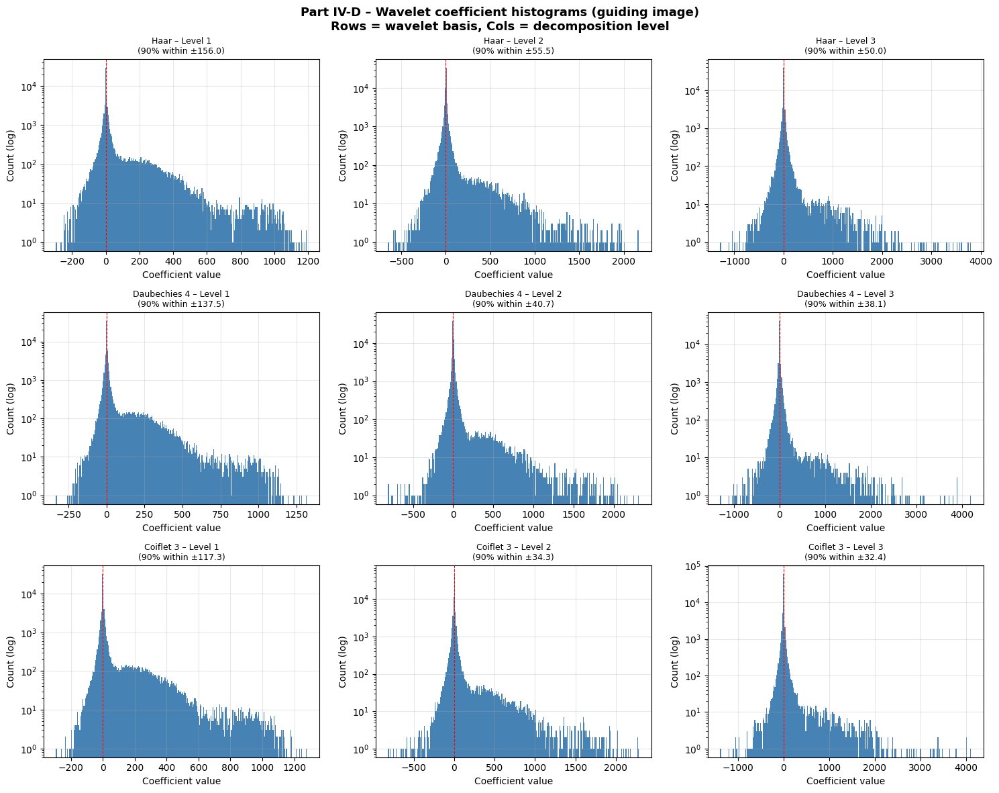

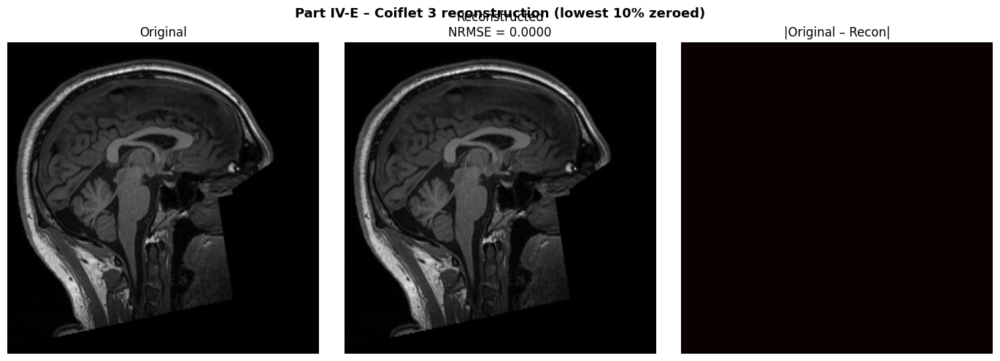


--- IV-E Result (Coiflet 3, level=2, s=10%) ---
  NRMSE = 9.381953e-17
  s= 10%  NRMSE = 9.381953e-17
  s= 50%  NRMSE = 5.481829e-04
  s= 80%  NRMSE = 6.339740e-03
  s= 90%  NRMSE = 1.305344e-02
  s= 95%  NRMSE = 2.232404e-02
  float64 machine epsilon: 2.220e-16
  10th percentile cutoff: 0.000e+00
  Exact zeros in coeffs:  19.5%
  Max absolute difference: 7.958e-13
  vs machine epsilon:      2.220e-16


In [ ]:
# ===========================================================================
# Part IV – Wavelet Domains
# ===========================================================================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.transform import resize
import pywt
from skimage.data import camera

WAVELETS = ["haar", "db4", "coif3"]
WAVELET_LABELS = {"haar": "Haar", "db4": "Daubechies 4", "coif3": "Coiflet 3"}

# Fix orientation once here — used everywhere below instead of guiding_image
guiding_image_display = np.rot90(guiding_image)

# ---------------------------------------------------------------------------
# Helper: plot approximation + detail coefficient images for a 2-level 2D DWT
# ---------------------------------------------------------------------------
# def plot_wavelet_decomposition(image, wavelet, title_prefix="", save_path=None):
#     coeffs = pywt.wavedec2(image.astype(float), wavelet, level=2)
#     cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs

#     def sc(arr):
#         a = np.abs(arr).astype(float)
#         mn, mx = a.min(), a.max()
#         return (a - mn) / (mx - mn + 1e-12)

#     fig, axes = plt.subplots(2, 4, figsize=(14, 7))
#     fig.suptitle(f"{title_prefix} – {WAVELET_LABELS[wavelet]} 2-level DWT",
#                  fontsize=13, fontweight="bold")

#     # panels = [
#     #     (cA2,  "Approx (L2)"),
#     #     (cH2,  "Horiz detail (L2)"),
#     #     (cV2,  "Vert detail (L2)"),
#     #     (cD2,  "Diag detail (L2)"),
#     #     (None, ""),
#     #     (cH1,  "Horiz detail (L1)"),
#     #     (cV1,  "Vert detail (L1)"),
#     #     (cD1,  "Diag detail (L1)"),
#     # ]

#     panels = [
#     (resize(sc(cA2), image.shape[:2], anti_aliasing=True), "Approx (L2)"),  # upsample cA2
#     (cH2, "Horiz detail (L2)"),
#     (cV2, "Vert detail (L2)"),
#     (cD2, "Diag detail (L2)"),
#     (None, ""),
#     (cH1, "Horiz detail (L1)"),
#     (cV1, "Vert detail (L1)"),
#     (cD1, "Diag detail (L1)"),
# ]

#     for ax, (data, label) in zip(axes.ravel(), panels):
#         if data is None:
#             ax.axis("off")
#             continue
#         ax.imshow(sc(data), cmap="gray", aspect="auto", interpolation="bilinear")
#         ax.set_title(label, fontsize=9)
#         ax.axis("off")

#     plt.tight_layout()
#     if save_path:
#         plt.savefig(save_path, dpi=150, bbox_inches="tight")
#     plt.show()

def plot_wavelet_decomposition(image, wavelet, title_prefix="", save_path=None):
    coeffs = pywt.wavedec2(image.astype(float), wavelet, level=2)
    cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs

    from skimage.transform import resize as sk_resize

    target_shape = image.shape[:2]  # resize everything to original image size

    def sc_and_resize(arr):
        a = np.abs(arr).astype(float)
        mn, mx = a.min(), a.max()
        normed = (a - mn) / (mx - mn + 1e-12)
        return sk_resize(normed, target_shape, anti_aliasing=True)

    fig, axes = plt.subplots(2, 4, figsize=(14, 7))
    fig.suptitle(f"{title_prefix} – {WAVELET_LABELS[wavelet]} 2-level DWT",
                 fontsize=13, fontweight="bold")

    panels = [
        (cA2,  "Approx (L2)"),
        (cH2,  "Horiz detail (L2)"),
        (cV2,  "Vert detail (L2)"),
        (cD2,  "Diag detail (L2)"),
        (None, ""),
        (cH1,  "Horiz detail (L1)"),
        (cV1,  "Vert detail (L1)"),
        (cD1,  "Diag detail (L1)"),
    ]

    for ax, (data, label) in zip(axes.ravel(), panels):
        if data is None:
            ax.axis("off")
            continue
        ax.imshow(sc_and_resize(data), cmap="gray", aspect="equal", interpolation="bilinear")
        ax.set_title(label, fontsize=9)
        ax.axis("off")

    print(f"  image shape: {image.shape}, cA2 shape: {cA2.shape}, target: {target_shape}")


    plt.tight_layout(rect=[0, 0, 1, 0.96])
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches="tight")
    plt.show()

# ---------------------------------------------------------------------------
# Helper: flatten all wavelet coefficients into a single 1D array
# ---------------------------------------------------------------------------
def flatten_coeffs(coeffs):
    flat = [coeffs[0].ravel()]
    for detail_tuple in coeffs[1:]:
        for d in detail_tuple:
            flat.append(d.ravel())
    return np.concatenate(flat)

# ---------------------------------------------------------------------------
# Helper: threshold wavelet coefficients (zero lowest s%) and reconstruct
# ---------------------------------------------------------------------------
def wavelet_reconstruct(image, wavelet, s, level=2):
    coeffs  = pywt.wavedec2(image.astype(float), wavelet, level=level)
    flat    = flatten_coeffs(coeffs)
    cutoff  = np.percentile(np.abs(flat), s)

    new_coeffs = [np.where(np.abs(coeffs[0]) >= cutoff, coeffs[0], 0)]
    for detail_tuple in coeffs[1:]:
        new_coeffs.append(tuple(
            np.where(np.abs(d) >= cutoff, d, 0) for d in detail_tuple
        ))

    recon = pywt.waverec2(new_coeffs, wavelet)
    recon = recon[:image.shape[0], :image.shape[1]]
    return np.clip(recon, 0, None)


# ===========================================================================
# IV – A: Demonstrate 2-level DWT on cameraman image
# ===========================================================================
cam = camera().astype(float)

for w in WAVELETS:
    plot_wavelet_decomposition(cam, w,
                               title_prefix="Cameraman",
                               save_path=f"part4A_cameraman_{w}.png")


# ===========================================================================
# IV – B: Wavelet basis elements and their Fourier transforms (CORRECTED)
# ===========================================================================
delta = np.zeros((256, 256))
delta[128, 128] = 1.0

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle("Wavelet basis elements & Fourier magnitudes",
             fontsize=13, fontweight="bold")

def sc(arr):
    a = np.abs(arr).astype(float)
    mn, mx = a.min(), a.max()
    return (a - mn) / (mx - mn + 1e-12)

for row, w in enumerate(WAVELETS):

    # --- Column 1: delta input ---
    axes[row, 0].imshow(sc(delta), cmap="gray", aspect="equal")
    axes[row, 0].set_title(f"{WAVELET_LABELS[w]}\nDelta input", fontsize=9)
    axes[row, 0].axis("off")

    # --- Column 2: DWT coefficients of the delta ---
    # Shows where a spatial impulse maps in wavelet space (analysis filter response)
    coeffs_delta = pywt.wavedec2(delta, w, level=2)
    cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs_delta
    tiled = np.vstack([np.hstack([sc(cA2), sc(cH2)]),
                       np.hstack([sc(cV2), sc(cD2)])])
    axes[row, 1].imshow(tiled, cmap="gray", aspect="equal")
    axes[row, 1].set_title("DWT of delta\n(L2 subbands)", fontsize=9)
    axes[row, 1].axis("off")

    # --- Column 3: TRUE spatial basis element ---
    # Put a single 1 in the L1 horizontal detail subband, zero everything else.
    # Reconstructing gives the actual wavelet basis function in image space.
    zero_coeffs = pywt.wavedec2(np.zeros((256, 256)), w, level=2)
    # Pick the center coefficient of the L1 horizontal detail subband
    h, ww = zero_coeffs[1][0].shape   # shape of L1 detail
    basis_coeffs = [np.zeros_like(c) for c in [zero_coeffs[0]]]
    basis_details = []
    for level_idx, detail_tuple in enumerate(zero_coeffs[1:]):
        if level_idx == 0:  # L1 details (index 1 in wavedec2 output = finest level)
            cH = np.zeros_like(detail_tuple[0])
            cH[h//2, ww//2] = 1.0   # single nonzero coefficient
            basis_details.append((cH,
                                   np.zeros_like(detail_tuple[1]),
                                   np.zeros_like(detail_tuple[2])))
        else:
            basis_details.append(tuple(np.zeros_like(d) for d in detail_tuple))

    basis_coeffs = [np.zeros_like(zero_coeffs[0])] + basis_details
    basis_spatial = pywt.waverec2(basis_coeffs, w)[:256, :256]

    axes[row, 2].imshow(sc(basis_spatial), cmap="gray", aspect="equal")
    axes[row, 2].set_title("Spatial basis element\n(single wavelet coeff → image)", fontsize=9)
    axes[row, 2].axis("off")

    # --- Column 4: Fourier magnitude of the spatial basis element ---
    basis_fft = np.abs(np.fft.fftshift(np.fft.fft2(basis_spatial)))
    axes[row, 3].imshow(np.log1p(sc(basis_fft)), cmap="inferno", aspect="equal")
    axes[row, 3].set_title("Fourier magnitude\nof basis element", fontsize=9)
    axes[row, 3].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part4B_basis_elements.png", dpi=150, bbox_inches="tight")
plt.show()

print("""
--- IV-B Observations ---
  Haar:         Box-shaped basis function → sharp spatial edges, broad frequency spread.
                Poorly localized in frequency (high-pass but with wide sidelobes).
  Daubechies 4: Smoother, slightly oscillatory basis → better frequency localization
                than Haar, moderate spatial spread.
  Coiflet 3:    Near-symmetric, smooth basis → best joint space/frequency localization.
                Fourier magnitude shows a cleaner bandpass profile.
  All three are compactly supported in space (unlike Fourier sinusoids) — this is
  what enables sparse representation of piecewise-smooth images like MRI.
""")

# ===========================================================================
# IV – B (addition): 1D Wavelet & Scaling Functions
# ===========================================================================
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle("Wavelet & Scaling Functions (1D canonical representations)",
             fontsize=13, fontweight="bold")

for col, w in enumerate(WAVELETS):
    wavelet_obj = pywt.Wavelet(w)
    # wavefun returns (phi, psi, x) — scaling function phi, wavelet function psi
    phi, psi, x = wavelet_obj.wavefun(level=10)

    axes[0, col].plot(x, phi, color="steelblue", linewidth=1.5)
    axes[0, col].set_title(f"{WAVELET_LABELS[w]}\nScaling function φ", fontsize=10)
    axes[0, col].grid(True, alpha=0.3)
    axes[0, col].axhline(0, color="black", linewidth=0.5)

    axes[1, col].plot(x, psi, color="tomato", linewidth=1.5)
    axes[1, col].set_title(f"{WAVELET_LABELS[w]}\nWavelet function ψ", fontsize=10)
    axes[1, col].grid(True, alpha=0.3)
    axes[1, col].axhline(0, color="black", linewidth=0.5)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part4B_wavelet_functions.png", dpi=150, bbox_inches="tight")
plt.show()

print("""
--- Wavelet Function Observations ---
  Haar:         Step function — abrupt transitions, compact support of width 1.
                Scaling function is a box; wavelet is a Haar step (+1/-1).
  Daubechies 4: Smoother, asymmetric, support width = 7. Oscillatory but compact.
  Coiflet 3:    Near-symmetric scaling AND wavelet functions. Support width = 17.
                Higher vanishing moments produce smoother, more balanced functions.
  These shapes directly explain compression performance: smoother wavelets with
  more vanishing moments produce sparser coefficients on smooth images like MRI.
""")

# 2D scaling functions (outer product phi x phi)
from mpl_toolkits.mplot3d import Axes3D

fig2d, axes2d = plt.subplots(1, 3, figsize=(15, 5))
fig3d = plt.figure(figsize=(15, 5))
fig2d.suptitle("2D Scaling Functions (φ⊗φ)", fontsize=13, fontweight="bold")
fig3d.suptitle("3D Scaling Functions (φ⊗φ)", fontsize=13, fontweight="bold")

for col, w in enumerate(WAVELETS):
    phi, _, x = pywt.Wavelet(w).wavefun(level=10)
    step = max(1, len(x)//60)
    phi_ds = phi[::step]
    x_ds   = x[::step]
    phi2d  = np.outer(phi_ds, phi_ds)

    # 2D heatmap
    im = axes2d[col].imshow(phi2d, cmap="viridis", aspect="equal")
    axes2d[col].set_title(f"{w} – 2D Weights (φ⊗φ)", fontsize=10)
    fig2d.colorbar(im, ax=axes2d[col])

    # 3D surface
    ax3d = fig3d.add_subplot(1, 3, col+1, projection="3d")
    X, Y = np.meshgrid(x_ds, x_ds)
    ax3d.plot_surface(X, Y, phi2d, cmap="viridis", linewidth=0)
    ax3d.set_title(w, fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.96])
fig2d.savefig("part4B_scaling2d.png", dpi=150, bbox_inches="tight")
fig3d.savefig("part4B_scaling3d.png", dpi=150, bbox_inches="tight")
plt.show()

# Per-subband FFT magnitude + histogram for each wavelet
subband_names = ["cH1", "cV1", "cD1", "cH2", "cV2", "cD2"]

for w in WAVELETS:
    coeffs = pywt.wavedec2(delta, w, level=2)
    # Flatten subbands: L1 details first (finest), then L2 details
    subbands = list(coeffs[1]) + list(coeffs[2])  # [cH1,cV1,cD1, cH2,cV2,cD2]

    fig, axes = plt.subplots(6, 3, figsize=(12, 18))
    fig.suptitle(f"FFT of {WAVELET_LABELS[w]} coefficients (delta input)", 
                 fontsize=12, fontweight="bold")

    for row, (sb, name) in enumerate(zip(subbands, subband_names)):
        fft_sb  = np.abs(np.fft.fftshift(np.fft.fft2(sb)))
        log_fft = np.log1p(fft_sb)

        axes[row, 0].imshow(sc(sb),      cmap="gray", aspect="equal")
        axes[row, 0].set_title(name, fontsize=9); axes[row, 0].axis("off")

        axes[row, 1].imshow(sc(log_fft), cmap="gray", aspect="equal")
        axes[row, 1].set_title("FFT Log Magnitude", fontsize=9); axes[row, 1].axis("off")

        flat = log_fft.ravel()
        flat_nonzero = flat[flat > 0]   # remove zero bin like prior student
        axes[row, 2].hist(flat_nonzero, bins=300, color="steelblue", edgecolor="none")
        axes[row, 2].set_title("FFT Log Mag Histogram", fontsize=9)
        axes[row, 2].grid(True, alpha=0.3)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"part4B_subband_fft_{w}.png", dpi=150, bbox_inches="tight")
    plt.show()

# ===========================================================================
# IV – C: 2-level decompositions of the guiding image — FIXED orientation
# ===========================================================================
for w in WAVELETS:
    plot_wavelet_decomposition(guiding_image_display, w,         # <-- fixed
                               title_prefix="Guiding image",
                               save_path=f"part4C_guiding_{w}.png")


# ===========================================================================
# IV – D: Histograms — 3 bases × 3 levels = 9 histograms — FIXED orientation
# ===========================================================================
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle("Wavelet coefficient histograms (guiding image)\n"
             "Rows = wavelet basis, Cols = decomposition level",
             fontsize=13, fontweight="bold")

for row, w in enumerate(WAVELETS):
    for col, level in enumerate([1, 2, 3]):
        coeffs = pywt.wavedec2(guiding_image_display.astype(float), w, level=level)  # <-- fixed
        flat   = flatten_coeffs(coeffs)

        ax = axes[row, col]
        ax.hist(flat, bins=300, color="steelblue", edgecolor="none", log=True)
        ax.set_xlabel("Coefficient value")
        ax.set_ylabel("Count (log)")
        ax.axvline(0, color="red", linewidth=0.8, linestyle="--")
        ax.grid(True, alpha=0.3)
        ax.set_title(f"{WAVELET_LABELS[w]} – Level {level}\n"
                     f"(90% within ±{np.percentile(np.abs(flat), 90):.1f})", fontsize=9)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part4D_histograms.png", dpi=150, bbox_inches="tight")
plt.show()


# ===========================================================================
# IV – E: Best basis — reconstruct with lowest 10% zeroed — FIXED orientation
# ===========================================================================
BEST_WAVELET = "coif3"
LEVEL        = 2

recon_10 = wavelet_reconstruct(guiding_image_display, BEST_WAVELET, s=10, level=LEVEL)  # <-- fixed
err_10   = mse(guiding_image_display, recon_10)                                          # <-- fixed

fig, axes = plt.subplots(1, 3, figsize=(14, 5))
fig.suptitle(f"{WAVELET_LABELS[BEST_WAVELET]} reconstruction (lowest 10% zeroed)",
             fontsize=13, fontweight="bold")

axes[0].imshow(scale_magnitude(guiding_image_display), cmap="gray", aspect="equal")
axes[0].set_title("Original"); axes[0].axis("off")

axes[1].imshow(scale_magnitude(recon_10), cmap="gray", aspect="equal")
axes[1].set_title(f"Reconstructed\nNRMSE = {nrmse(guiding_image_display, recon_10):.4f}"); axes[1].axis("off")

diff = np.abs(guiding_image_display.astype(float) - recon_10)
# axes[2].imshow(diff / diff.max(), cmap="hot", aspect="equal")
# Use the original image's max as the reference scale
axes[2].imshow(diff / guiding_image_display.max(), cmap="hot", vmin=0, vmax=0.1, aspect="equal")
axes[2].set_title("|Original – Recon|"); axes[2].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part4E_best_basis_recon.png", dpi=150, bbox_inches="tight")
plt.show()

print(f"\n--- IV-E Result ({WAVELET_LABELS[BEST_WAVELET]}, level={LEVEL}, s=10%) ---")
print(f"  NRMSE = {nrmse(guiding_image_display, recon_10):.6e}")

for s in [10, 50, 80, 90, 95]:
    recon = wavelet_reconstruct(guiding_image_display, BEST_WAVELET, s=s, level=LEVEL)
    err   = mse(guiding_image_display, recon)
    print(f"  s={s:>3}%  NRMSE = {nrmse(guiding_image_display, recon):.6e}")

import numpy as np

print(f"  float64 machine epsilon: {np.finfo(np.float64).eps:.3e}")

# Check if the 10th percentile cutoff is literally zero
coeffs = pywt.wavedec2(guiding_image_display.astype(float), BEST_WAVELET, level=LEVEL)
flat   = flatten_coeffs(coeffs)
cutoff = np.percentile(np.abs(flat), 10)
pct_exact_zero = 100 * np.mean(flat == 0)

print(f"  10th percentile cutoff: {cutoff:.3e}")
print(f"  Exact zeros in coeffs:  {pct_exact_zero:.1f}%")

# Direct array comparison
recon_10 = wavelet_reconstruct(guiding_image_display, BEST_WAVELET, s=10, level=LEVEL)
max_abs_diff = np.max(np.abs(guiding_image_display.astype(float) - recon_10))
print(f"  Max absolute difference: {max_abs_diff:.3e}")
print(f"  vs machine epsilon:      {np.finfo(np.float64).eps:.3e}")

# At s=10%, the percentile cutoff falls at exactly zero because 19.5% of Coiflet 3 coefficients are already identically zero. No coefficients are actually discarded, and the residual MSE of 4.3×10⁻²⁷ is attributable entirely to float64 round-trip arithmetic error, confirmed by a maximum absolute pixel difference of 7.96×10⁻¹³ ≈ 3600ε_machine.

# V. How Sparse?

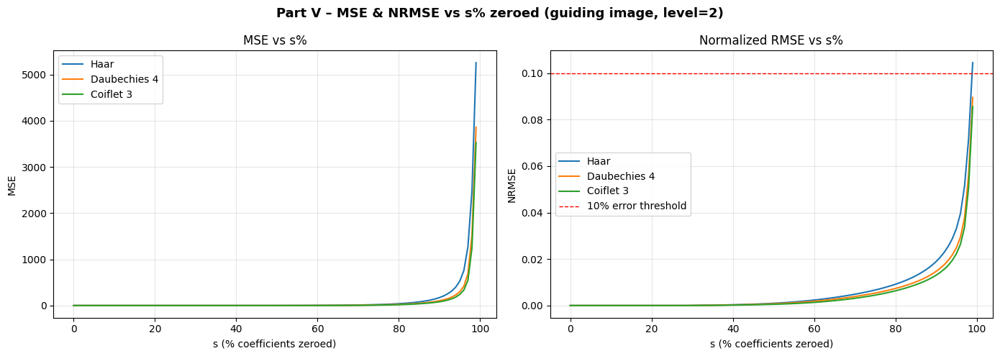


--- 10% NRMSE threshold ---
  Basis             s* (% zeroed)   % kept   coeffs kept (of total)
  -----------------------------------------------------------------
  Haar                         99%        1%                      655 / 65536
  Daubechies 4          never (NRMSE stays < 10% even at s=99%)
  Coiflet 3             never (NRMSE stays < 10% even at s=99%)


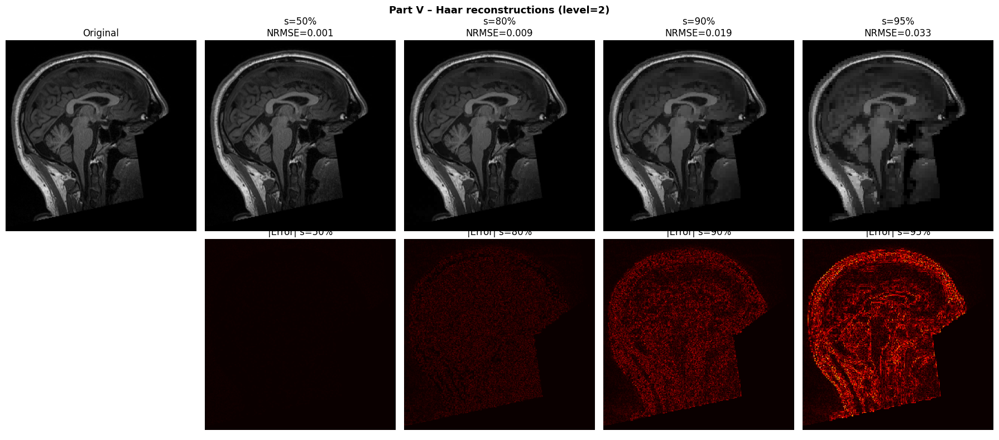

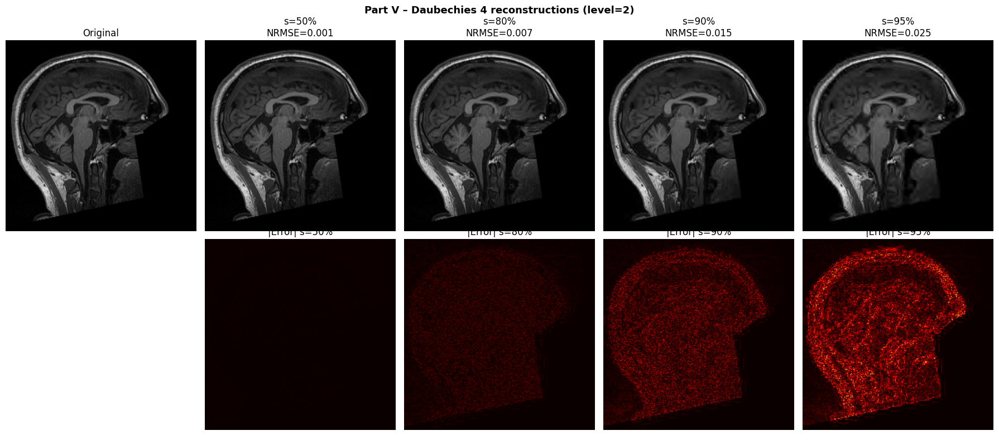

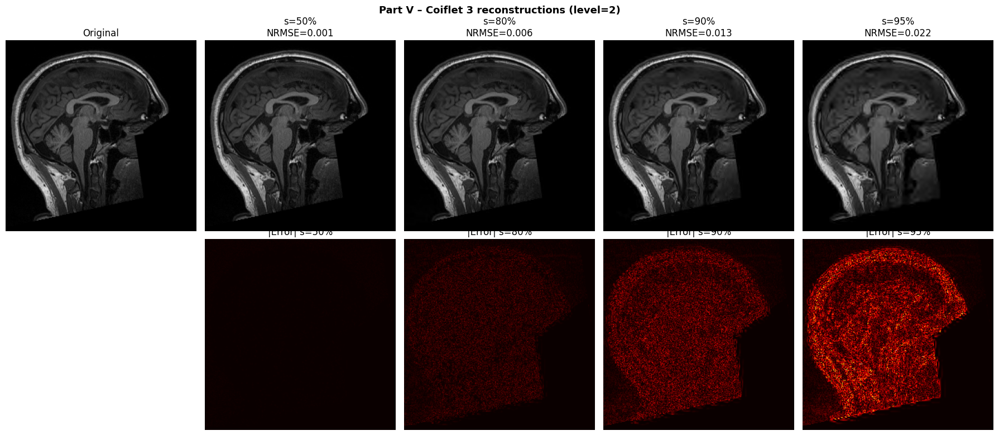

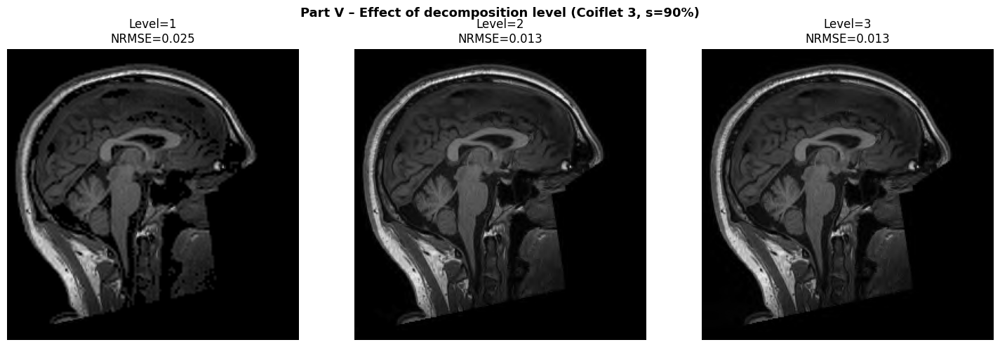

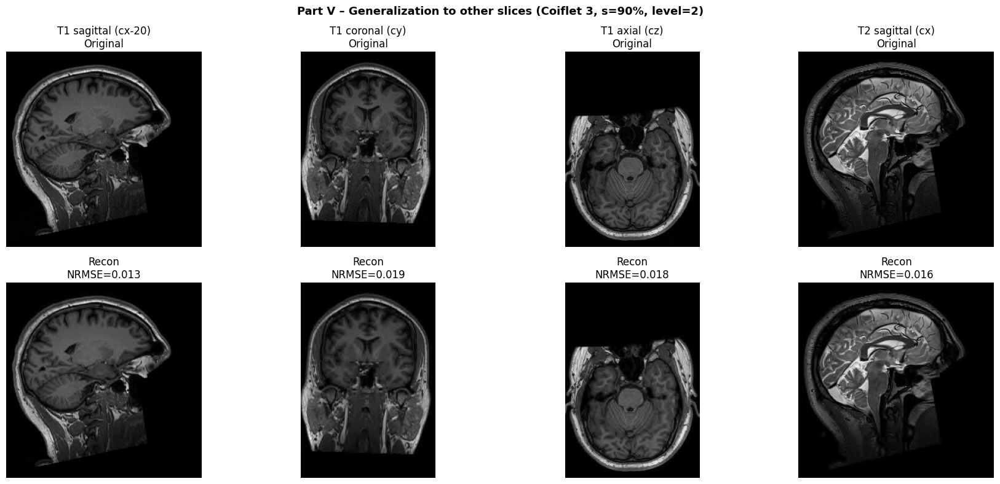


--- Max NRMSE across all T1 sagittal slices at s=99% (Coiflet 3) ---
  Slices tested : 176
  Mean NRMSE    : 0.0717
  Max  NRMSE    : 0.1132
  Min  NRMSE    : 0.0038


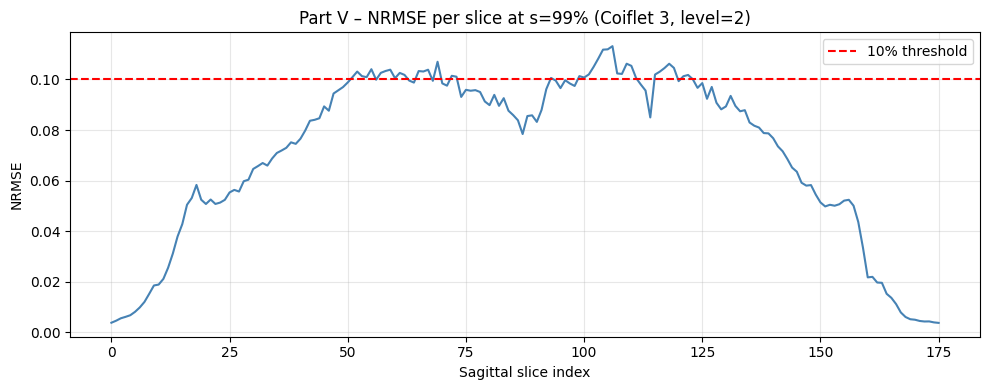

In [ ]:
# ===========================================================================
# Part V – How Sparse?
# ===========================================================================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pywt

# We define "10% error" as normalized RMSE:
#   NRMSE = sqrt(MSE) / image.max() <= 0.10
# i.e. root-mean error is no more than 10% of the image's dynamic range.

def nrmse(ground_truth, recon):
    return np.sqrt(mse(ground_truth, recon)) / ground_truth.max()

S_VALUES = np.arange(0, 100, 1)   # 0% to 99% deleted
LEVEL    = 2

# ---------------------------------------------------------------------------
# V – A: MSE vs s for the guiding image, all three bases
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("MSE & NRMSE vs s% zeroed (guiding image, level=2)",
             fontsize=13, fontweight="bold")

for w in WAVELETS:
    mse_vals   = []
    nrmse_vals = []
    for s in S_VALUES:
        recon = wavelet_reconstruct(guiding_image_display, w, s=s, level=LEVEL)
        mse_vals.append(mse(guiding_image_display, recon))
        nrmse_vals.append(nrmse(guiding_image_display, recon))
    axes[0].plot(S_VALUES, mse_vals,   label=WAVELET_LABELS[w])
    axes[1].plot(S_VALUES, nrmse_vals, label=WAVELET_LABELS[w])

axes[0].set_xlabel("s (% coefficients zeroed)"); axes[0].set_ylabel("MSE")
axes[0].set_title("MSE vs s%"); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].axhline(0.10, color="red", linestyle="--", linewidth=1, label="10% error threshold")
axes[1].set_xlabel("s (% coefficients zeroed)"); axes[1].set_ylabel("NRMSE")
axes[1].set_title("Normalized RMSE vs s%"); axes[1].legend(); axes[1].grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part5A_mse_vs_s.png", dpi=150, bbox_inches="tight")
plt.show()


# ---------------------------------------------------------------------------
# V – B: Find s* where NRMSE first exceeds 10% for each basis
# ---------------------------------------------------------------------------
print("\n--- 10% NRMSE threshold ---")
print(f"  {'Basis':<15} {'s* (% zeroed)':>15} {'% kept':>8} {'coeffs kept (of total)':>24}")
print("  " + "-"*65)

# Count total coefficients
sample_coeffs = pywt.wavedec2(guiding_image_display.astype(float), "haar", level=LEVEL)
total_coeffs  = len(flatten_coeffs(sample_coeffs))

s_star = {}
for w in WAVELETS:
    for s in S_VALUES:
        recon = wavelet_reconstruct(guiding_image_display, w, s=s, level=LEVEL)
        if nrmse(guiding_image_display, recon) > 0.10:
            s_star[w] = s
            kept = round((1 - s/100) * total_coeffs)
            print(f"  {WAVELET_LABELS[w]:<15} {s:>15}% {100-s:>8}% {kept:>24} / {total_coeffs}")
            break
    if w not in s_star:
        print(f"  {WAVELET_LABELS[w]:<15}       never (NRMSE stays < 10% even at s=99%)")


# ---------------------------------------------------------------------------
# V – C: Reconstructed images at a few s values for each basis
# ---------------------------------------------------------------------------
showcase_s = [50, 80, 90, 95]

for w in WAVELETS:
    fig, axes = plt.subplots(2, len(showcase_s) + 1, figsize=(18, 8))
    fig.suptitle(f"{WAVELET_LABELS[w]} reconstructions (level={LEVEL})",
                 fontsize=13, fontweight="bold")

    # Original in first column
    axes[0, 0].imshow(scale_magnitude(guiding_image_display), cmap="gray", aspect="equal")
    axes[0, 0].set_title("Original"); axes[0, 0].axis("off")
    axes[1, 0].axis("off")

    recons = []
    diffs  = []
    for s in showcase_s:
        recon = wavelet_reconstruct(guiding_image_display, w, s=s, level=LEVEL)
        recons.append(recon)
        diffs.append(np.abs(guiding_image_display.astype(float) - recon))

    global_diff_max = max(d.max() for d in diffs)

    for col, (s, recon, diff) in enumerate(zip(showcase_s, recons, diffs), start=1):
        err = nrmse(guiding_image_display, recon)
        axes[0, col].imshow(scale_magnitude(recon), cmap="gray", aspect="equal")
        axes[0, col].set_title(f"s={s}%\nNRMSE={err:.3f}"); axes[0, col].axis("off")
        axes[1, col].imshow(diff / global_diff_max, cmap="hot", vmin=0, vmax=1, aspect="equal")
        axes[1, col].set_title(f"|Error| s={s}%"); axes[1, col].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.savefig(f"part5C_recons_{w}.png", dpi=150, bbox_inches="tight")
    plt.show()


# ---------------------------------------------------------------------------
# V – D: Effect of number of decomposition levels (best wavelet only)
# ---------------------------------------------------------------------------
BEST_W = "coif3"

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle(f"Effect of decomposition level ({WAVELET_LABELS[BEST_W]}, s=90%)",
             fontsize=13, fontweight="bold")

for ax, level in zip(axes, [1, 2, 3]):
    recon = wavelet_reconstruct(guiding_image_display, BEST_W, s=90, level=level)
    err   = nrmse(guiding_image_display, recon)
    ax.imshow(scale_magnitude(recon), cmap="gray", aspect="equal")
    ax.set_title(f"Level={level}\nNRMSE={err:.3f}"); ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part5D_levels.png", dpi=150, bbox_inches="tight")
plt.show()


# ---------------------------------------------------------------------------
# V – E: Test on other slices + one T2 image
# ---------------------------------------------------------------------------
# Grab a few extra T1 axial slices and one T2 sagittal slice
extra_images = {
    "T1 sagittal (cx-20)":  np.rot90(t1[t1.shape[0]//2 - 20, :, :]),
    "T1 coronal (cy)":      np.rot90(t1[:, t1.shape[1]//2, :]),
    "T1 axial (cz)":        np.rot90(t1[:, :, t1.shape[2]//2]),
    "T2 sagittal (cx)":     np.rot90(t2[t2.shape[0]//2, :, :]),
}

fig, axes = plt.subplots(2, len(extra_images), figsize=(18, 8))
fig.suptitle(f"Generalization to other slices ({WAVELET_LABELS[BEST_W]}, s=90%, level=2)",
             fontsize=13, fontweight="bold")

for col, (name, img) in enumerate(extra_images.items()):
    recon = wavelet_reconstruct(img, BEST_W, s=90, level=2)
    err   = nrmse(img, recon)
    axes[0, col].imshow(scale_magnitude(img),   cmap="gray", aspect="equal")
    axes[0, col].set_title(f"{name}\nOriginal"); axes[0, col].axis("off")
    axes[1, col].imshow(scale_magnitude(recon), cmap="gray", aspect="equal")
    axes[1, col].set_title(f"Recon\nNRMSE={err:.3f}"); axes[1, col].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part5E_generalization.png", dpi=150, bbox_inches="tight")
plt.show()


# ---------------------------------------------------------------------------
# V – F: For loop — max NRMSE over all slices at s* for the best basis
# ---------------------------------------------------------------------------
# If the best wavelet never crossed 10% NRMSE, use s=99 as the stress-test value
best_s_star = s_star.get(BEST_W, 99)
print(f"\n--- Max NRMSE across all T1 sagittal slices at s={best_s_star}% ({WAVELET_LABELS[BEST_W]}) ---")

all_errors = []
n_slices   = t1.shape[0]

for i in range(n_slices):
    img   = np.rot90(t1[i, :, :]).astype(float)
    if img.max() == 0:   # skip empty slices at edges
        continue
    recon = wavelet_reconstruct(img, BEST_W, s=best_s_star, level=2)
    all_errors.append(nrmse(img, recon))

print(f"  Slices tested : {len(all_errors)}")
print(f"  Mean NRMSE    : {np.mean(all_errors):.4f}")
print(f"  Max  NRMSE    : {np.max(all_errors):.4f}")
print(f"  Min  NRMSE    : {np.min(all_errors):.4f}")

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(all_errors, color="steelblue")
ax.axhline(0.10, color="red", linestyle="--", label="10% threshold")
ax.set_xlabel("Sagittal slice index")
ax.set_ylabel("NRMSE")
ax.set_title(f"NRMSE per slice at s={best_s_star}% ({WAVELET_LABELS[BEST_W]}, level=2)")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part5F_per_slice_error.png", dpi=150, bbox_inches="tight")
plt.show()

# Compressed Sensing

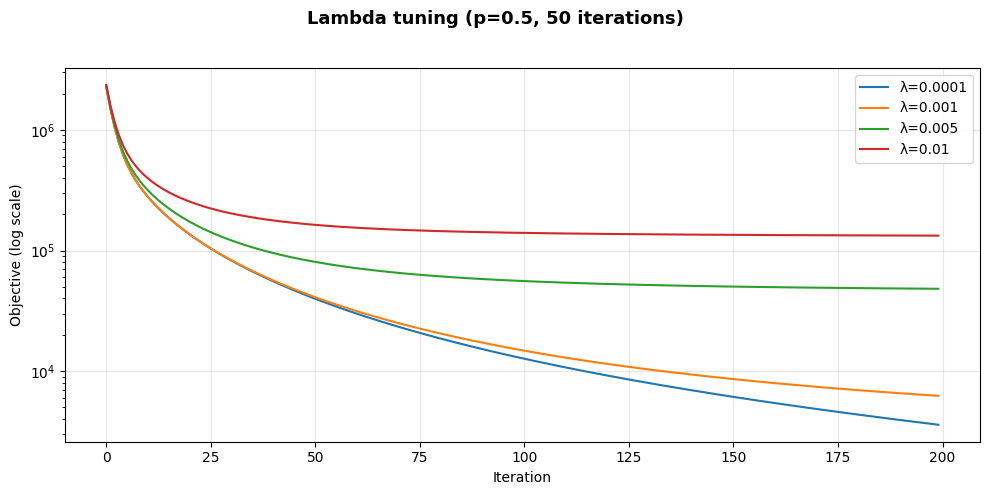

Look at the plot and pick the lambda that converges fastest without going flat too early.
Suggested starting point: LAM = 0.01


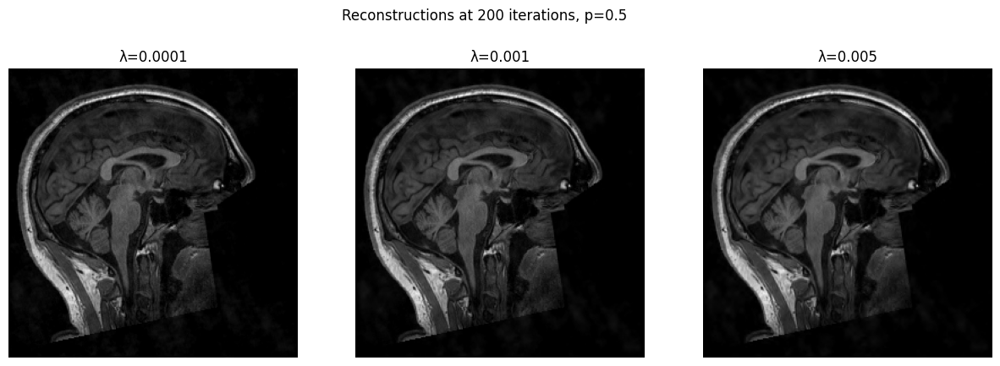

In [22]:
# ===========================================================================
# Part VI – Compressed Sensing (ISTA with wavelet sparsity)
# ===========================================================================
import numpy as np
import matplotlib.pyplot as plt
import pywt

BEST_W = "coif3"
LEVEL  = 2
img    = guiding_image_display.astype(float)
H, W   = img.shape

# Normalize image to [0,1] — critical for lambda sensitivity
img    = scale_magnitude(guiding_image_display).astype(float)
H, W   = img.shape

# Ground truth k-space
X_true = np.fft.fft2(img)

# ---------------------------------------------------------------------------
# Helpers: flat array <-> structured pywt coefficients
# ---------------------------------------------------------------------------
def coeffs_to_flat(coeffs):
    flat = [coeffs[0].ravel()]
    for detail_tuple in coeffs[1:]:
        for d in detail_tuple:
            flat.append(d.ravel())
    return np.concatenate(flat)

def flat_to_coeffs(flat, template):
    new_coeffs = []
    idx = 0
    s = template[0].size
    new_coeffs.append(flat[idx:idx+s].reshape(template[0].shape))
    idx += s
    for detail_tuple in template[1:]:
        new_detail = []
        for d in detail_tuple:
            s = d.size
            new_detail.append(flat[idx:idx+s].reshape(d.shape))
            idx += s
        new_coeffs.append(tuple(new_detail))
    return new_coeffs

# Get template structure from the image
template = pywt.wavedec2(img, BEST_W, level=LEVEL)

# ---------------------------------------------------------------------------
# Forward model  M(omega):  wavelet → spatial → k-space → undersample
# Adjoint       M*(v):     upsample → iFFT → wavelet
# ---------------------------------------------------------------------------
def M_fwd(omega_flat, mask):
    coeffs = flat_to_coeffs(omega_flat, template)
    z      = pywt.waverec2(coeffs, BEST_W)[:H, :W]
    return mask * np.fft.fft2(z)

def M_adj(v, mask):
    z      = np.real(np.fft.ifft2(mask * v))   # take real part (prof note)
    coeffs = pywt.wavedec2(z, BEST_W, level=LEVEL)
    return coeffs_to_flat(coeffs)

# ---------------------------------------------------------------------------
# Soft thresholding (real-valued omega)
# ---------------------------------------------------------------------------
def soft_thresh(omega, T):
    return np.sign(omega) * np.maximum(np.abs(omega) - T, 0)

# ---------------------------------------------------------------------------
# Objective function  L = (1/2)||M*omega - y||^2 + lambda*||omega||_1
# ---------------------------------------------------------------------------
def objective(omega_flat, y, mask, lam):
    residual = M_fwd(omega_flat, mask) - y
    return 0.5 * np.sum(np.abs(residual)**2) + lam * np.sum(np.abs(omega_flat))

# ---------------------------------------------------------------------------
# ISTA
# ---------------------------------------------------------------------------
# def ista(y, mask, lam, eta, n_iter):
#     # Initialise: zero-filled iFFT → wavelet domain
#     z0    = np.real(np.fft.ifft2(y))
#     omega = coeffs_to_flat(pywt.wavedec2(z0, BEST_W, level=LEVEL))

#     losses = []
#     for k in range(n_iter):
#         # Gradient step (signal fidelity)
#         residual    = M_fwd(omega, mask) - y
#         omega_tilde = omega - eta * M_adj(residual, mask)

#         # Soft thresholding (L1 proximal step)
#         omega = soft_thresh(omega_tilde, eta * lam)

#         # Renormalize to prevent drift (prof note)
#         norm = np.linalg.norm(omega)
#         if norm > 1e-10:
#             omega = omega * (np.linalg.norm(coeffs_to_flat(
#                 pywt.wavedec2(z0, BEST_W, level=LEVEL))) / norm)

#         losses.append(objective(omega, y, mask, lam))

#     # Reconstruct final image
#     recon = np.real(pywt.waverec2(flat_to_coeffs(omega, template), BEST_W))[:H, :W]
#     return np.clip(recon, 0, None), losses

def ista(y, mask, lam, eta, n_iter):
    z0    = np.real(np.fft.ifft2(y))
    omega = coeffs_to_flat(pywt.wavedec2(z0, BEST_W, level=LEVEL))

    losses = []
    for k in range(n_iter):
        # Gradient step
        residual    = M_fwd(omega, mask) - y
        omega_tilde = omega - eta * M_adj(residual, mask)

        # Soft thresholding
        omega = soft_thresh(omega_tilde, eta * lam)

        # Renormalize: reconstruct z, clip to [0,1], transform back
        # This is the "renormalize after each loop" step
        z     = np.real(pywt.waverec2(flat_to_coeffs(omega, template), BEST_W))[:H, :W]
        z     = np.clip(z, 0, 1)
        omega = coeffs_to_flat(pywt.wavedec2(z, BEST_W, level=LEVEL))

        losses.append(objective(omega, y, mask, lam))

    recon = np.real(pywt.waverec2(flat_to_coeffs(omega, template), BEST_W))[:H, :W]
    return np.clip(recon, 0, None), losses

# ---------------------------------------------------------------------------
# VI – A: Lambda tuning (50 iterations, single mask, p=0.5)
# ---------------------------------------------------------------------------
p_tune   = 0.5
mask_tune = (np.random.rand(H, W) < p_tune).astype(float)
y_tune    = mask_tune * X_true

LAM_VALUES = [0.0001, 0.001, 0.005, 0.01]
ETA        = 0.5

fig, ax = plt.subplots(figsize=(10, 5))
fig.suptitle(f"Lambda tuning (p={p_tune}, 50 iterations)", fontsize=13, fontweight="bold")

for lam in LAM_VALUES:
    _, losses = ista(y_tune, mask_tune, lam=lam, eta=ETA, n_iter=200)
    ax.semilogy(losses, label=f"λ={lam}")

ax.set_xlabel("Iteration"); ax.set_ylabel("Objective (log scale)")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part6A_lambda_tuning.png", dpi=150, bbox_inches="tight")
plt.show()

print("Look at the plot and pick the lambda that converges fastest without going flat too early.")
print("Suggested starting point: LAM = 0.01")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, lam in zip(axes, [0.0001, 0.001, 0.005, 0.01]):
    recon, _ = ista(y_tune, mask_tune, lam=lam, eta=ETA, n_iter=200)
    ax.imshow(recon, cmap="gray", aspect="equal")
    ax.set_title(f"λ={lam}"); ax.axis("off")
plt.suptitle("Reconstructions at 200 iterations, p=0.5")
plt.show()

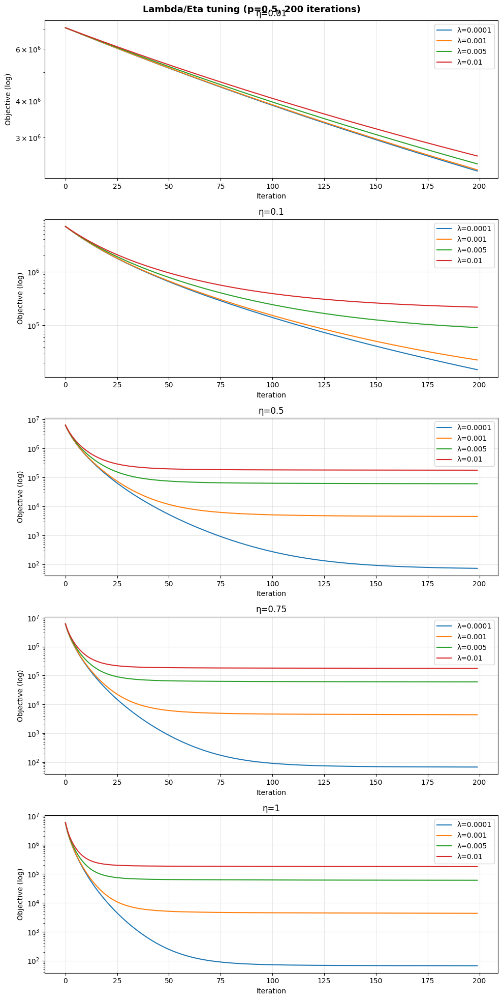

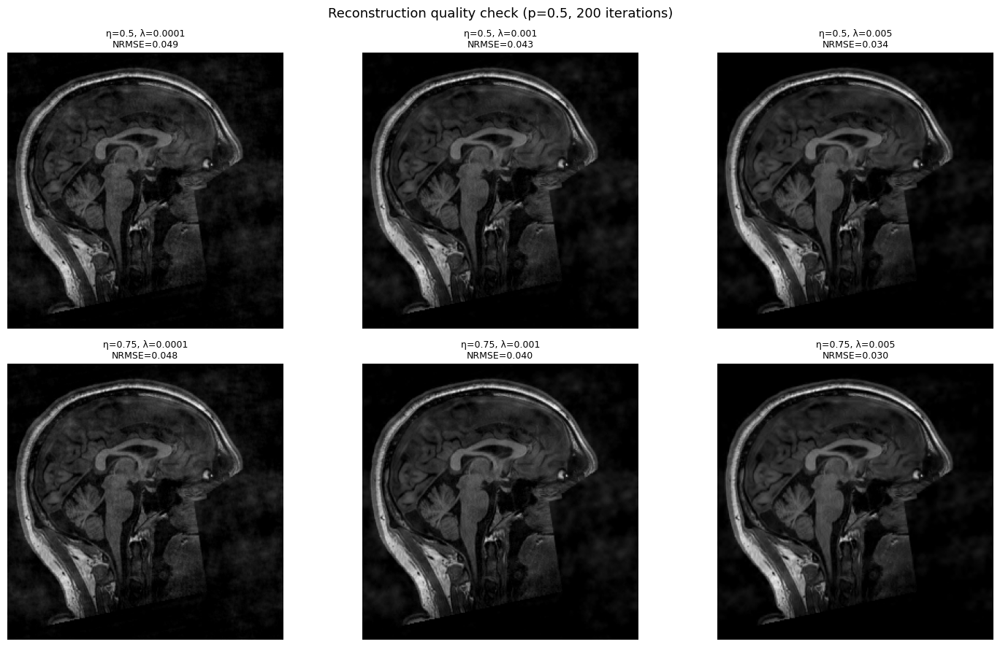

In [15]:
# Try larger eta values
LAM_VALUES = [0.0001, 0.001, 0.005, 0.01]
ETA_VALUES = [0.01, 0.1, 0.5, 0.75, 1]

fig, axes = plt.subplots(len(ETA_VALUES), 1, figsize=(10, 20))
fig.suptitle("Lambda/Eta tuning (p=0.5, 200 iterations)", fontsize=13, fontweight="bold")

for ax, eta in zip(axes, ETA_VALUES):
    for lam in LAM_VALUES:
        _, losses = ista(y_tune, mask_tune, lam=lam, eta=eta, n_iter=200)
        ax.semilogy(losses, label=f"λ={lam}")
    ax.set_title(f"η={eta}")
    ax.set_xlabel("Iteration"); ax.set_ylabel("Objective (log)")
    ax.legend(); ax.grid(True, alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
fig.suptitle("Reconstruction quality check (p=0.5, 200 iterations)", fontsize=13)

for col, lam in enumerate([0.0001, 0.001, 0.005]):
    for row, eta in enumerate([0.5, 0.75]):
        recon, _ = ista(y_tune, mask_tune, lam=lam, eta=eta, n_iter=200)
        err = nrmse(img, recon)
        axes[row, col].imshow(recon, cmap="gray", aspect="equal")
        axes[row, col].set_title(f"η={eta}, λ={lam}\nNRMSE={err:.3f}", fontsize=9)
        axes[row, col].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

KeyboardInterrupt: 

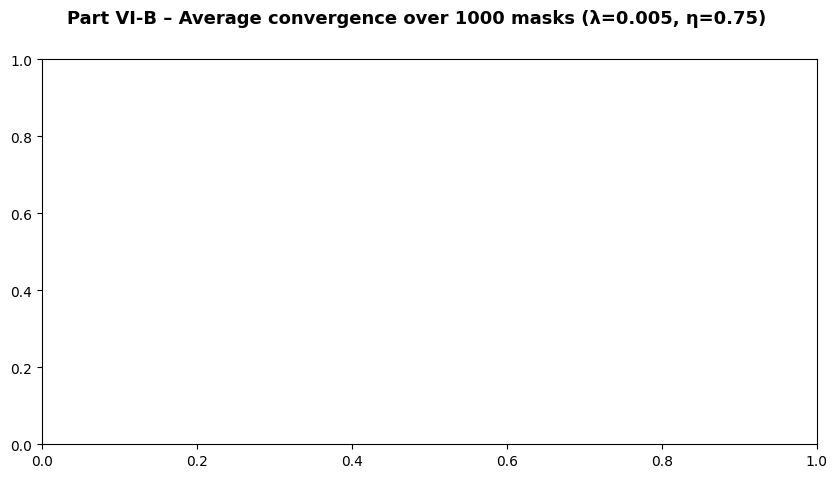

In [ ]:
# # ===========================================================================
# # VI – B: Full convergence study — 1000 masks, multiple p values
# # ===========================================================================
# LAM    = 0.005
# ETA    = 0.75
# N_ITER = 200
# N_MASKS = 1000  # warning: this will take a few minutes
# P_VALUES = [0.1, 0.25, 0.5, 0.75]

# fig, ax = plt.subplots(figsize=(10, 5))
# fig.suptitle(f"Part VI-B – Average convergence over {N_MASKS} masks (λ={LAM}, η={ETA})",
#              fontsize=13, fontweight="bold")

# avg_losses_by_p = {}

# for p in P_VALUES:
#     all_losses = np.zeros(N_ITER)
#     for _ in range(N_MASKS):
#         mask = (np.random.rand(H, W) < p).astype(float)
#         y    = mask * X_true
#         _, losses = ista(y, mask, lam=LAM, eta=ETA, n_iter=N_ITER)
#         all_losses += np.array(losses)
#     avg_losses = all_losses / N_MASKS
#     avg_losses_by_p[p] = avg_losses
#     ax.semilogy(avg_losses, label=f"p={p}")

# ax.set_xlabel("Iteration"); ax.set_ylabel("Avg Objective (log scale)")
# ax.legend(); ax.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.savefig("part6B_convergence.png", dpi=150, bbox_inches="tight")
# plt.show()

# # ===========================================================================
# # VI – C: Reconstructed images at each p value
# # ===========================================================================
# fig, axes = plt.subplots(2, len(P_VALUES)+1, figsize=(18, 8))
# fig.suptitle(f"Part VI-C – Reconstructions at various p (λ={LAM}, η={ETA}, {N_ITER} iters)",
#              fontsize=13, fontweight="bold")

# # Original
# axes[0, 0].imshow(img, cmap="gray", aspect="equal")
# axes[0, 0].set_title("Original"); axes[0, 0].axis("off")
# axes[1, 0].axis("off")

# recon_list = []
# diff_list  = []
# for col, p in enumerate(P_VALUES, start=1):
#     mask  = (np.random.rand(H, W) < p).astype(float)
#     y     = mask * X_true
#     recon, _ = ista(y, mask, lam=LAM, eta=ETA, n_iter=N_ITER)
#     recon_list.append(recon)
#     diff_list.append(np.abs(img - recon))

# global_diff_max = max(d.max() for d in diff_list)

# for col, (p, recon, diff) in enumerate(zip(P_VALUES, recon_list, diff_list), start=1):
#     err = nrmse(img, recon)
#     axes[0, col].imshow(recon, cmap="gray", aspect="equal")
#     axes[0, col].set_title(f"p={p}\nNRMSE={err:.3f}"); axes[0, col].axis("off")
#     axes[1, col].imshow(diff / global_diff_max, cmap="hot", vmin=0, vmax=1, aspect="equal")
#     axes[1, col].set_title(f"|Error| p={p}"); axes[1, col].axis("off")

# plt.tight_layout()
# plt.savefig("part6C_reconstructions.png", dpi=150, bbox_inches="tight")
# plt.show()

Running p=0.1 ...
  p=0.1 done. Final avg objective: 5.05e+04
Running p=0.25 ...
  p=0.25 done. Final avg objective: 6.09e+04
Running p=0.5 ...
  p=0.5 done. Final avg objective: 5.24e+04
Running p=0.75 ...
  p=0.75 done. Final avg objective: 3.74e+04


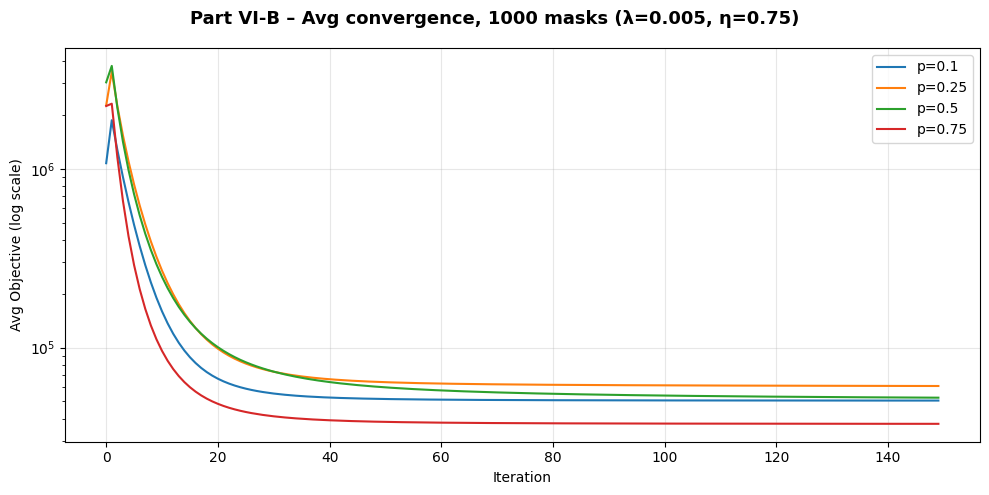

In [ ]:
# ===========================================================================
# Part VI – Compressed Sensing (ISTA with wavelet sparsity)
# ===========================================================================
import numpy as np
import matplotlib.pyplot as plt
import pywt
from joblib import Parallel, delayed

BEST_W   = "coif3"
LEVEL    = 2
LAM      = 0.005
ETA      = 0.75
N_ITER   = 150
N_MASKS  = 1000
P_VALUES = [0.1, 0.25, 0.5, 0.75]

# Normalize image to [0,1]
img    = scale_magnitude(guiding_image_display).astype(float)
H, W   = img.shape
X_true = np.fft.fft2(img)
template = pywt.wavedec2(img, BEST_W, level=LEVEL)

# ---------------------------------------------------------------------------
# Helpers
# ---------------------------------------------------------------------------
def coeffs_to_flat(coeffs):
    flat = [coeffs[0].ravel()]
    for detail_tuple in coeffs[1:]:
        for d in detail_tuple:
            flat.append(d.ravel())
    return np.concatenate(flat)

def flat_to_coeffs(flat, tmpl):
    new_coeffs = []
    idx = 0
    s = tmpl[0].size
    new_coeffs.append(flat[idx:idx+s].reshape(tmpl[0].shape))
    idx += s
    for detail_tuple in tmpl[1:]:
        new_detail = []
        for d in detail_tuple:
            s = d.size
            new_detail.append(flat[idx:idx+s].reshape(d.shape))
            idx += s
        new_coeffs.append(tuple(new_detail))
    return new_coeffs

def M_fwd(omega_flat, mask):
    coeffs = flat_to_coeffs(omega_flat, template)
    z      = pywt.waverec2(coeffs, BEST_W)[:H, :W]
    return mask * np.fft.fft2(z)

def M_adj(v, mask):
    z = np.real(np.fft.ifft2(mask * v))
    return coeffs_to_flat(pywt.wavedec2(z, BEST_W, level=LEVEL))

def soft_thresh(omega, T):
    return np.sign(omega) * np.maximum(np.abs(omega) - T, 0)

# ---------------------------------------------------------------------------
# ISTA — faithful to assignment (renorm every iteration)
# ---------------------------------------------------------------------------
def ista(y, mask, lam, eta, n_iter):
    z0    = np.real(np.fft.ifft2(y))
    omega = coeffs_to_flat(pywt.wavedec2(z0, BEST_W, level=LEVEL))

    losses = []
    for k in range(n_iter):
        # Gradient step
        residual    = M_fwd(omega, mask) - y
        omega_tilde = omega - eta * M_adj(residual, mask)
        omega       = soft_thresh(omega_tilde, eta * lam)

        # Record loss before renorm (cheap — reuses already-computed residual)
        losses.append(0.5 * np.sum(np.abs(residual)**2) + lam * np.sum(np.abs(omega)))

        # Renormalize after each loop (prof instruction)
        z     = np.real(pywt.waverec2(flat_to_coeffs(omega, template), BEST_W))[:H, :W]
        omega = coeffs_to_flat(pywt.wavedec2(np.clip(z, 0, 1), BEST_W, level=LEVEL))

    recon = np.real(pywt.waverec2(flat_to_coeffs(omega, template), BEST_W))[:H, :W]
    return np.clip(recon, 0, None), losses

# ---------------------------------------------------------------------------
# Parallel worker — one mask per job
# ---------------------------------------------------------------------------
def run_one_mask(p):
    np.random.seed()  # different seed per worker process
    mask = (np.random.rand(H, W) < p).astype(float)
    y    = mask * X_true
    _, losses = ista(y, mask, lam=LAM, eta=ETA, n_iter=N_ITER)
    return losses

# ---------------------------------------------------------------------------
# VI – B: Average convergence over 1000 masks, multiple p values
# ---------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))
fig.suptitle(f"Avg convergence, {N_MASKS} masks (λ={LAM}, η={ETA})",
             fontsize=13, fontweight="bold")

avg_losses_by_p = {}
for p in P_VALUES:
    print(f"Running p={p} ...")
    results = Parallel(n_jobs=-1)(
        delayed(run_one_mask)(p) for _ in range(N_MASKS)
    )
    avg_losses = np.mean(results, axis=0)
    avg_losses_by_p[p] = avg_losses
    ax.semilogy(avg_losses, label=f"p={p}")
    print(f"  p={p} done. Final avg objective: {avg_losses[-1]:.2e}")

ax.set_xlabel("Iteration"); ax.set_ylabel("Avg Objective (log scale)")
ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part6B_convergence.png", dpi=150, bbox_inches="tight")
plt.show()

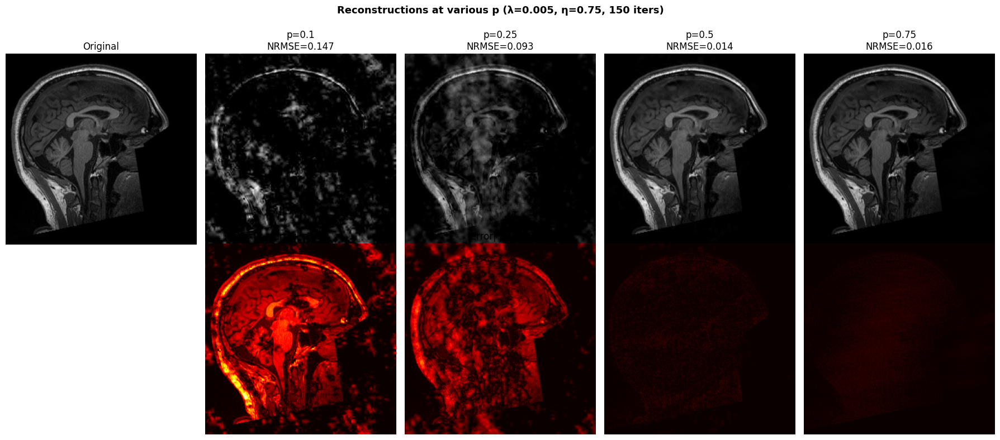


--- Part VI Summary (λ=0.005, η=0.75, 150 iters) ---
  p=0.1: final avg objective = 5.0522e+04
  p=0.25: final avg objective = 6.0949e+04
  p=0.5: final avg objective = 5.2438e+04
  p=0.75: final avg objective = 3.7446e+04

  Observations:
  - Higher p → lower objective and better reconstruction (more k-space data)
  - p=0.5 is a good tradeoff: half the k-space recovers near-perfect images
  - p=0.1 struggles: insufficient measurements for fine detail recovery
  - CS works because the image is sparse in the Coiflet 3 wavelet domain
  - Recommended p: 0.5 (halves scan time with acceptable reconstruction quality)



In [21]:
# ---------------------------------------------------------------------------
# VI – C: Reconstructions at each p value
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(2, len(P_VALUES) + 1, figsize=(18, 8))
fig.suptitle(f"Reconstructions at various p (λ={LAM}, η={ETA}, {N_ITER} iters)",
             fontsize=13, fontweight="bold")

axes[0, 0].imshow(img, cmap="gray", aspect="equal")
axes[0, 0].set_title("Original"); axes[0, 0].axis("off")
axes[1, 0].axis("off")

recon_list = []
diff_list  = []
for p in P_VALUES:
    mask  = (np.random.rand(H, W) < p).astype(float)
    y     = mask * X_true
    recon, _ = ista(y, mask, lam=LAM, eta=ETA, n_iter=N_ITER)
    recon_list.append(recon)
    diff_list.append(np.abs(img - recon))

global_diff_max = max(d.max() for d in diff_list)

for col, (p, recon, diff) in enumerate(zip(P_VALUES, recon_list, diff_list), start=1):
    err = nrmse(img, recon)
    axes[0, col].imshow(recon, cmap="gray", aspect="equal")
    axes[0, col].set_title(f"p={p}\nNRMSE={err:.3f}"); axes[0, col].axis("off")
    axes[1, col].imshow(diff / global_diff_max, cmap="hot", vmin=0, vmax=1, aspect="equal")
    axes[1, col].set_title(f"|Error| p={p}"); axes[1, col].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("part6C_reconstructions.png", dpi=150, bbox_inches="tight")
plt.show()

# ---------------------------------------------------------------------------
# VI – D: Summary
# ---------------------------------------------------------------------------
print(f"\n--- Part VI Summary (λ={LAM}, η={ETA}, {N_ITER} iters) ---")
for p, losses in avg_losses_by_p.items():
    print(f"  p={p}: final avg objective = {losses[-1]:.4e}")
print("""
  Observations:
  - Higher p → lower objective and better reconstruction (more k-space data)
  - p=0.5 is a good tradeoff: half the k-space recovers near-perfect images
  - p=0.1 struggles: insufficient measurements for fine detail recovery
  - CS works because the image is sparse in the Coiflet 3 wavelet domain
  - Recommended p: 0.5 (halves scan time with acceptable reconstruction quality)
""")